## Valence-Arousal Prediction Audio and Visual Features

The Mediaeval 2017 Emotional Impact of Movies Task includes the data in the emotional domain 
(valence - arousal  regression) and  fear ( binary classification).
We have displayed the valence and arousal of all the movies in the dataset.
Also the time of the movie where fear is present is specified with the value of the second.
According to the Russell's circumplex model we were expectinf the "FEAR" to be appeared in the negative vallence, positive arousal part of the circumflex.
However in some movies, we can see that frightment exists in positive valence with negative arousal also.


In [2]:

import pandas as pd
from pandas import DataFrame, Series

import matplotlib.pyplot as plt
import matplotlib.colors as colors


import matplotlib
matplotlib.style.use('ggplot')

%matplotlib inline

import numpy as np
import pylab as pl
import re, fileinput
import os.path
import glob
import pickle
import sys


In [3]:
import numpy as np 
print(np.__version__) 
print(np.__path__)


1.11.3
['/home/yt/anaconda2/lib/python2.7/site-packages/numpy']


In [4]:
from sklearn.metrics import accuracy_score
from sklearn import preprocessing
from sklearn import metrics
from sklearn.svm import LinearSVC
from sklearn.svm import SVC
from sklearn import svm
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split, cross_val_score
import scipy
from scipy.stats import pearsonr


In [5]:
#Dev data
#movieNames = ['After_The_Rain','Attitude_Matters','Barely_legal_stories','Between_Viewings','Big_Buck_Bunny','Chatter','Cloudland','Damaged_Kung_Fu','Decay','Elephant_s_Dream','First_Bite','Full_Service','Islands','Lesson_Learned','Norm','Nuclear_Family','On_time','Origami','Parafundit','Payload','Riding_The_Rails','Sintel','Spaceman','Superhero','Tears_of_Steel','The_room_of_franz_kafka','The_secret_number','To_Claire_From_Sonny','Wanted','You_Again']

pathcontinuous = "/home/yt/Desktop/cvpr2014/repro/mediaeval/data/dataset/ContinuousLIRIS-ACCEDE/"
continuousAnnotationsFolder = pathcontinuous +'continuous-annotations/'
devdatacontinous =  pathcontinuous + "continuous-movies/"
pathcontfeatures = "/home/yt/Desktop/cvpr2014/repro/mediaeval/data/dataset/Continuous/features-out/"

datahome = '/home/yt/Desktop/mediaeval2017'

med2017visualFeaturesfolder='/home/yt/Desktop/mediaeval2017/MEDIAEVAL17-DevSet-Visual_features/MEDIAEVAL17-DevSet-Visual_features/features/'
med2017audiofolder='/home/yt/Desktop/mediaeval2017/MEDIAEVAL17-DevSet-Audio_features/MEDIAEVAL17-DevSet-Audio_features/features/'
med2017annotationsFolder = '/home/yt/Desktop/mediaeval2017/MEDIAEVAL17-DevSet-Valence_Arousal-annotations/MEDIAEVAL17-DevSet-Valence_Arousal-annotations/annotations/'
med2017fearFolder = '/home/yt/Desktop/mediaeval2017/MEDIAEVAL17-DevSet-Fear-annotations/MEDIAEVAL17-DevSet-Fear-annotations/annotations/'
med2017dataFolder = devdatacontinous

### Test Data

med2017visualfolderTest='/home/yt/Desktop/mediaeval2017/MEDIAEVAL17-TestSet-Visual_features/MEDIAEVAL17-TestSet-Visual_features/visual_features/'
med2017audiofolderTest = '/home/yt/Desktop/mediaeval2017/MEDIAEVAL17-TestSet-Audio_features/MEDIAEVAL17-TestSet-Audio_features/audio_features/'
med2017datafolderTest = '/home/yt/Desktop/mediaeval2017/MEDIAEVAL17-TestSet-Data/MEDIAEVAL17-TestSet-Data/data/'

med2017testfeatures = "/home/yt/Desktop/cvpr2014/repro/mediaeval/data/dataset/Continuous/features-out/"

facesfolder = '/home/yt/Desktop/cvpr2014/repro/mediaeval/data/dataset/dlibfaces/'
framesfolder = '/home/yt/Desktop/cvpr2014/repro/mediaeval/data/dataset/movframes/'
openfacesfolder = '/home/yt/Desktop/cvpr2014/repro/mediaeval/data/dataset/faceinfo/'


In [66]:
fpsMovie = [['After_The_Rain',23.976],
            ['Attitude_Matters',29.97],
            ['Barely_legal_stories',23.976],
            ['Between_Viewings',25],
            ['Big_Buck_Bunny',24],
            ['Chatter',24],
                ['Cloudland',25],
                ['Damaged_Kung_Fu',25],
                ['Decay',23.976],
                ['Elephant_s_Dream',24],
                ['First_Bite',25],
                ['Full_Service',29.97],
                ['Islands',23.976],
                ['Lesson_Learned',29.97],
                ['Norm',25],
                ['Nuclear_Family',23.976],
                ['On_time',30],
                ['Origami',24],
                ['Parafundit',24],
                ['Payload',25],
                ['Riding_The_Rails',23.976],
                ['Sintel',24],
                ['Spaceman',23.976],
                ['Superhero',29.97],
                ['Tears_of_Steel',24],
                ['The_room_of_franz_kafka',29.786],
                ['The_secret_number',23.976],
                ['To_Claire_From_Sonny',23.976],
                ['Wanted',25],
                ['You_Again',29.97]]

contmoviesfps = pd.DataFrame(fpsMovie,columns=['name','fps'])
contmoviesfps.set_index('name', inplace=True)
contmoviesfps.index.name = None
#contmoviesfps.index
#contmoviesfps.values
contmoviesfps['f'] = np.round(contmoviesfps['fps'])
def getfps(movname):
    return contmoviesfps.loc[movname ]['f']

def getfps(movname):
    return contmoviesfps.loc[movname ]['f']

In [67]:
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

import seaborn as sns

def displayframe(movie,number):
    filename = framesfolder+movie +'.mp4-'+ '{0:05d}'.format(number) +'.jpg'

    img=mpimg.imread(filename)
    plt.figure(figsize=(20,30))
    plt.grid(False)
    
    imgplot = plt.imshow(img)
    plt.show()


In [42]:
#in minutes
def frame2minutes(moviename,frameno,isframepersec=True):
    fps = getfps(moviename)
    if isframepersec:
        secs = frameno
    else:
        secs = frameno/fps
    mins = secs / 60
    sec = (secs%60)
    return mins, sec

#in seconds
def frame2time(moviename,frameno,isframepersec=True):
    if (isframepersec):
        fps = getfps(moviename)
        return frameno/fps
    return frameno
    

def frame2sampleid(moviename,frameno,isframepersec=True):
    return frame2time(moviename,frameno)/5


def time2frame(moviename,hours=0,minutes=0,secs=0,isframepersec=True):
    totalsec= hours*60*60 + minutes*60 + secs
    if isframepersec:
        return totalsec
    
    fps = getfps(moviename)
    return totalsec*fps


In [43]:
time2frame('Sintel',minutes=6)

360

In [44]:
frame2minutes('Sintel',340)

(5, 40)

In [45]:
frame2minutes('Sintel',623)

(10, 23)

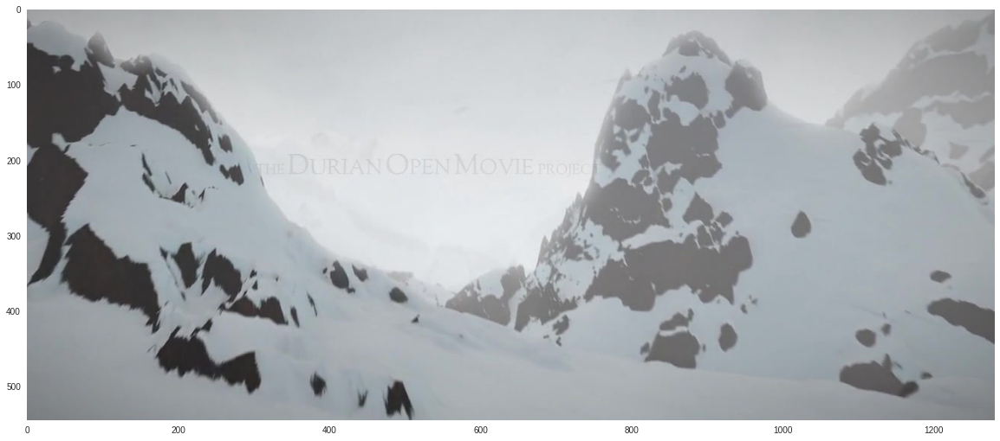

In [58]:
displayframe('Sintel',10)


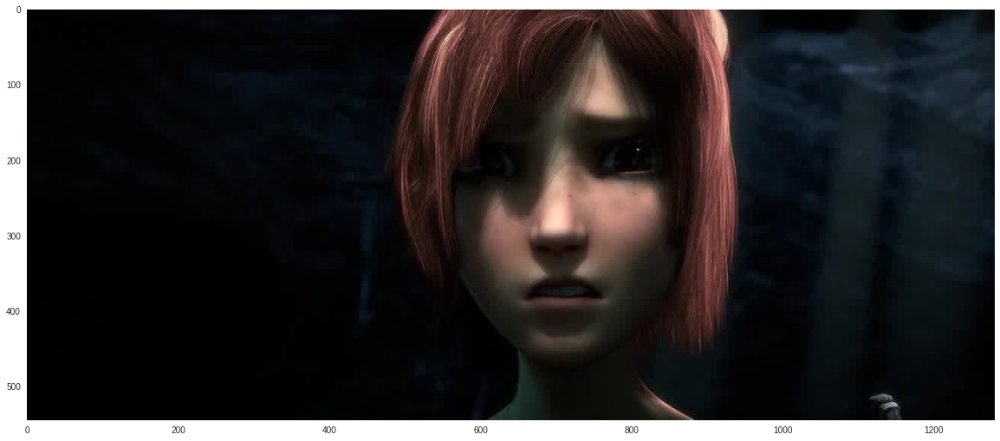

In [59]:
displayframe('Sintel',623)

In [60]:
files = glob.glob(med2017datafolderTest+'*')
testmovieNames =[ f.split('/')[-1].replace('.mp4','') for f in sorted(files) ]

In [61]:
files = glob.glob(med2017dataFolder+'*')
movieNames =[ f.split('/')[-1].replace('.mp4','') for f in sorted(files) ]

In [62]:
def getfacedf(moviename):
    filename = facesfolder + moviename +'.mp4-faces.txt'
    df = pd.read_csv(filename,sep=' ')
    
    df['topratio'] = df['top']/df['hframe'] 
    df['bottomratio'] = df['bottom']/df['hframe'] 
    df['leftratio'] = df['left']/df['wframe'] 
    df['rightratio'] = df['right']/df['wframe']
    df['fheight'] =  (df['bottom']-df['top'])/df['hframe'] 
    df['fwidth'] =  (df['right']-df['left'])/df['wframe'] 
    df['farea'] = df['fheight']*df['fwidth']
    df['fcx'] = df['fheight'] / 2
    df['fcy'] = df['fwidth'] / 2
    
    #df[ df['noface']>0]
    cols = ['noface','fcx','fcy','topratio','bottomratio','leftratio','rightratio','fheight','fwidth','farea']
    return df[cols]

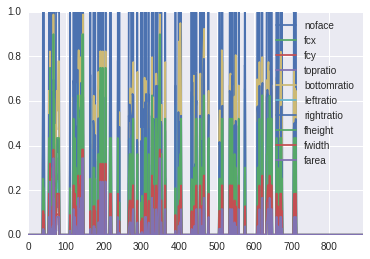

In [81]:
df= getfacedf('Sintel')
#df= getfacedf('After_The_Rain')
#df= getfacedf('Attitude_Matters')
#df= getfacedf('Sintel')
t = df #[df['noface']>0][['fcx','fcy']]
plt.figure(figsize=(5,15))
t.plot()

In [82]:
#movieNames,testmovieNames

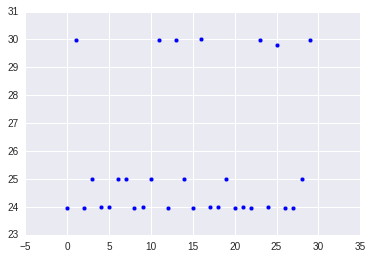

In [83]:
#contmoviesfps.plot.line()
plt.scatter(range(contmoviesfps.shape[0]), contmoviesfps['fps'])

In [84]:
print getfps(u'Sintel')

24.0


In [85]:
movgroups_wodecay = {
    0:['You_Again','Damaged_Kung_Fu','The_secret_number','Spaceman'],
    1:['Cloudland','Origami','Riding_The_Rails','Tears_of_Steel','Sintel'],
    2:['On_time','Elephant_s_Dream','Norm','Big_Buck_Bunny','Chatter','Full_Service'],
    3:['Islands','To_Claire_From_Sonny','Nuclear_Family','After_The_Rain','Parafundit'],
    4:['The_room_of_franz_kafka','Attitude_Matters','Lesson_Learned','Superhero'],
    5:['First_Bite','Wanted','Between_Viewings','Barely_legal_stories','Payload']
}

movgroups = {
    0:['You_Again','Damaged_Kung_Fu','The_secret_number','Spaceman'],
    1:['Cloudland','Origami','Riding_The_Rails','Tears_of_Steel','Sintel'],
    2:['On_time','Elephant_s_Dream','Norm','Big_Buck_Bunny','Chatter','Full_Service'],
    3:['Islands','To_Claire_From_Sonny','Nuclear_Family','After_The_Rain','Parafundit'],
    4:['The_room_of_franz_kafka','Attitude_Matters','Lesson_Learned','Superhero'],
    5:['First_Bite','Wanted','Between_Viewings','Barely_legal_stories','Payload'],
    6:['Decay']
}

mov2groups = {
    0:['Decay'],
    1:['You_Again','Damaged_Kung_Fu','The_secret_number','Spaceman'],
    2:['Cloudland','Origami','Riding_The_Rails','Tears_of_Steel','Sintel'],
    3:['On_time','Elephant_s_Dream','Norm','Big_Buck_Bunny','Chatter','Full_Service'],
    4:['Islands','To_Claire_From_Sonny','Nuclear_Family','After_The_Rain','Parafundit'],
    5:['The_room_of_franz_kafka','Attitude_Matters','Lesson_Learned','Superhero'],
    6:['First_Bite','Wanted','Between_Viewings','Barely_legal_stories','Payload'],
}


def gettraintestmovielist(mlist,groups=movgroups):
    testlist = groups[mlist]
    trainlist = []
    for idx, group in enumerate(groups):
        if idx != mlist:
            for g in groups[idx]:
                trainlist.append(g)
    return trainlist, testlist

''' 
def gettraintest2movielist(foldno,groups=mov2groups):
    if foldno==1:
        mlist=[1,2]
    elif foldno==2:
        mlist=[3,4]
    elif foldno==3:
        mlist=[5,6]
    elif foldno==4:
        mlist=[2,3]
    elif foldno==5:
        mlist=[4,5]
    else:
        mlist=[]
    
    testlist = [] 
    for i in mlist:
        for f in groups[i]:
            testlist.append(f)
            
    trainlist =[]
    for idx, group in enumerate(groups):
        for f in groups[idx]:
            if f not in testlist:
                trainlist.append(f)
                
    return trainlist, testlist
'''

' \ndef gettraintest2movielist(foldno,groups=mov2groups):\n    if foldno==1:\n        mlist=[1,2]\n    elif foldno==2:\n        mlist=[3,4]\n    elif foldno==3:\n        mlist=[5,6]\n    elif foldno==4:\n        mlist=[2,3]\n    elif foldno==5:\n        mlist=[4,5]\n    else:\n        mlist=[]\n    \n    testlist = [] \n    for i in mlist:\n        for f in groups[i]:\n            testlist.append(f)\n            \n    trainlist =[]\n    for idx, group in enumerate(groups):\n        for f in groups[idx]:\n            if f not in testlist:\n                trainlist.append(f)\n                \n    return trainlist, testlist\n'

In [86]:
#gettraintestmovielist(4)

In [87]:
gettraintestmovielist(2)


(['You_Again',
  'Damaged_Kung_Fu',
  'The_secret_number',
  'Spaceman',
  'Cloudland',
  'Origami',
  'Riding_The_Rails',
  'Tears_of_Steel',
  'Sintel',
  'Islands',
  'To_Claire_From_Sonny',
  'Nuclear_Family',
  'After_The_Rain',
  'Parafundit',
  'The_room_of_franz_kafka',
  'Attitude_Matters',
  'Lesson_Learned',
  'Superhero',
  'First_Bite',
  'Wanted',
  'Between_Viewings',
  'Barely_legal_stories',
  'Payload',
  'Decay'],
 ['On_time',
  'Elephant_s_Dream',
  'Norm',
  'Big_Buck_Bunny',
  'Chatter',
  'Full_Service'])

## Valence - Arousal Annotations
Thank you for downloading LIRIS-ACCEDE dataset.
This file contains valence/arousal annotations for the LIRIS-ACCEDE continuous part that is used for the first subtask of the MEDIAEVAL 2017 Emotional Impact of Movies task.
For each of the 30 movies, consecutive ten seconds-segments sliding over the whole movie with a shift of 5 seconds are considered and provided with valence and arousal annotations.
Each txt file contains 4 columns separated by tabulations. The first column is the segment id, starting from 0, the second column is the starting time of the segment in the movie and the third and fourth columns are respectively the valence and arousal values for this segment.

In [88]:
def getShotDf(movie,folder=pathcontfeatures):
    filename =  folder + movie + '.mp4-shot-times.txt'
    shotarray = np.genfromtxt(filename, delimiter=' ',dtype=int)
    df = pd.DataFrame(shotarray,columns=['cut'])
    fps=getfps(movie)
    #fps
    df['time'] = df['cut']*1. / fps
    return df

In [89]:
x = getShotDf('Sintel')['time']
getfps('Sintel')

24.0

In [90]:
x[3]

42.5

In [91]:
def getAnnotationDf(movname,folder=med2017annotationsFolder):
    filename = os.path.join(folder, movname + '-MEDIAEVAL2017-valence_arousal.txt')
    annotation = np.genfromtxt(filename, names=True, delimiter='\t', dtype=None)
    df = pd.DataFrame(annotation)
    return df

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f7be611ba50>,
        <matplotlib.axes._subplots.AxesSubplot object at 0x7f7be5fd9ad0>]], dtype=object)

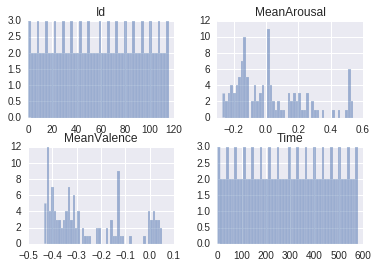

In [92]:
df = getAnnotationDf(movieNames[0])
df.hist(alpha=0.5,bins=50)

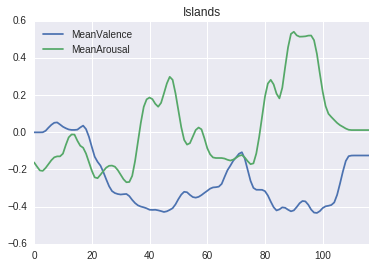

In [93]:
df[['MeanValence','MeanArousal']].plot(ax=plt.gca(),title='Islands')

In [94]:
#df.head()
#df.describe()
df = getAnnotationDf('Islands')
df.head()

,Id,Time,MeanValence,MeanArousal
0,0,0,0.098658,-0.098712
1,1,5,0.137632,-0.108957
2,2,10,0.198495,-0.115744
3,3,15,0.279805,-0.116271
4,4,20,0.358050,-0.100744


## Shot boudaries

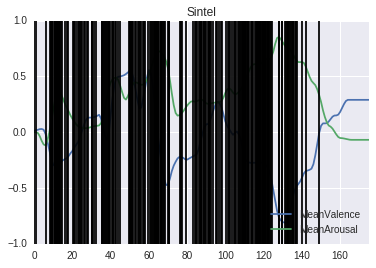

In [80]:
#plt.scatter(x,np.ones(len(x)))
movname = 'Sintel'
df = getAnnotationDf(movname)
df[['MeanValence','MeanArousal']].plot(ax=plt.gca(),title=movname)
cuts = getShotDf(movname)['time']
for i in range(len(cuts)):
    x =cuts[i]/5
    plt.axvline(x,linestyle='-',color='black')

#plt.title('Partial Autocorrelation Function')
#plt.tight_layout()

## Valence, Arousal histogram plots for Dev-Set

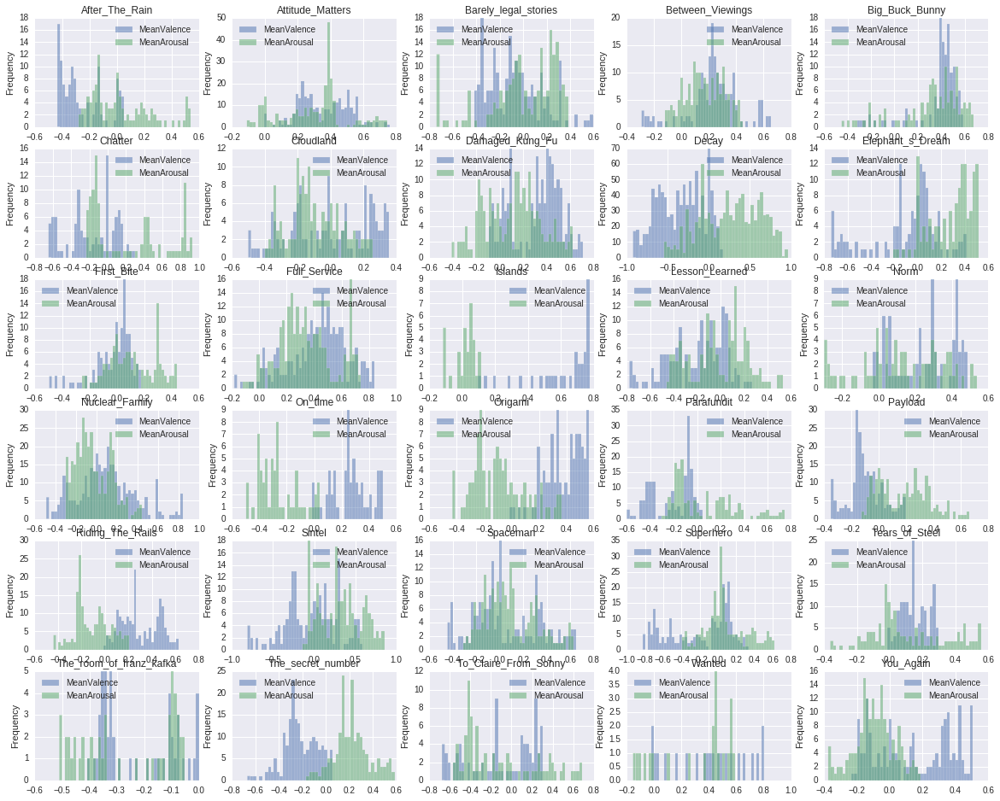

In [95]:
fix, axes = plt.subplots(figsize=(20,16))
for ii, mov in enumerate(movieNames):
    if (ii+1 > 30):
        plt.subplot(6,5,ii)
    else :
        plt.subplot(6,5,ii+1)
    df = getAnnotationDf(mov)
    df[['MeanValence','MeanArousal']].plot.hist(ax=plt.gca(),title=mov,alpha=0.5,bins=50)

## Valence , Arousal plots for Dev-Set

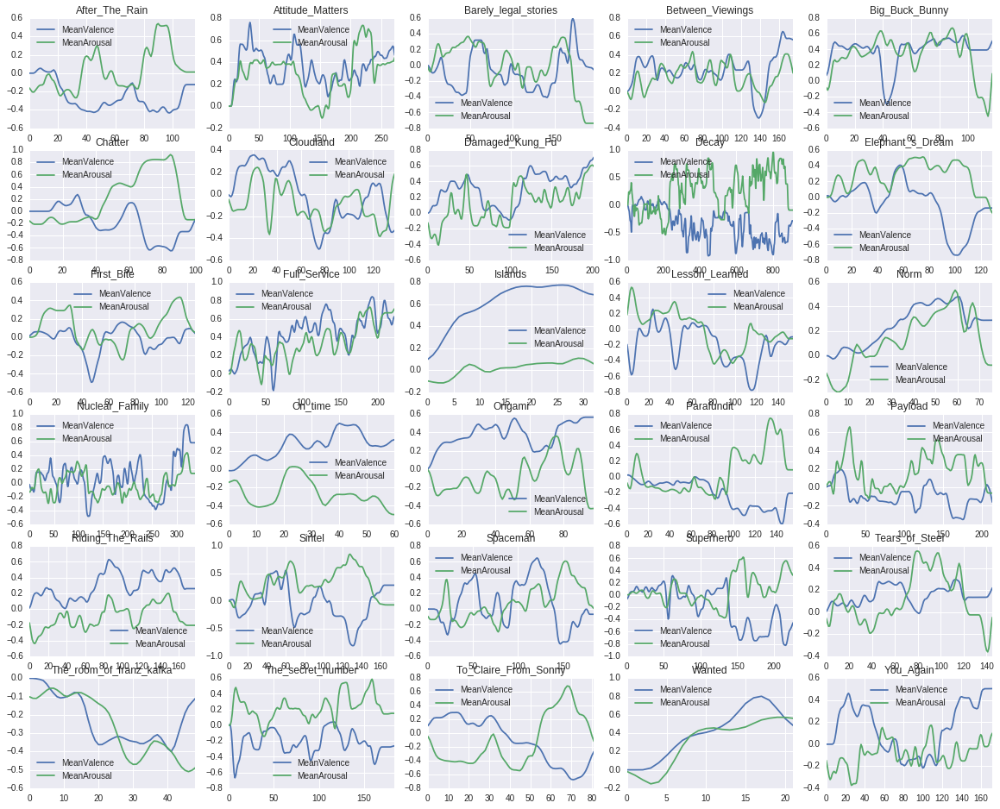

In [96]:
fix, axes = plt.subplots(figsize=(20,16))
for ii, mov in enumerate(movieNames):
    plt.subplot(6,5,ii+1)
    df = getAnnotationDf(mov)
    df[['MeanValence','MeanArousal']].plot(ax=plt.gca(),title=mov)
    #.hist(alpha=0.5,bins=50)


## Cut times with Annotations

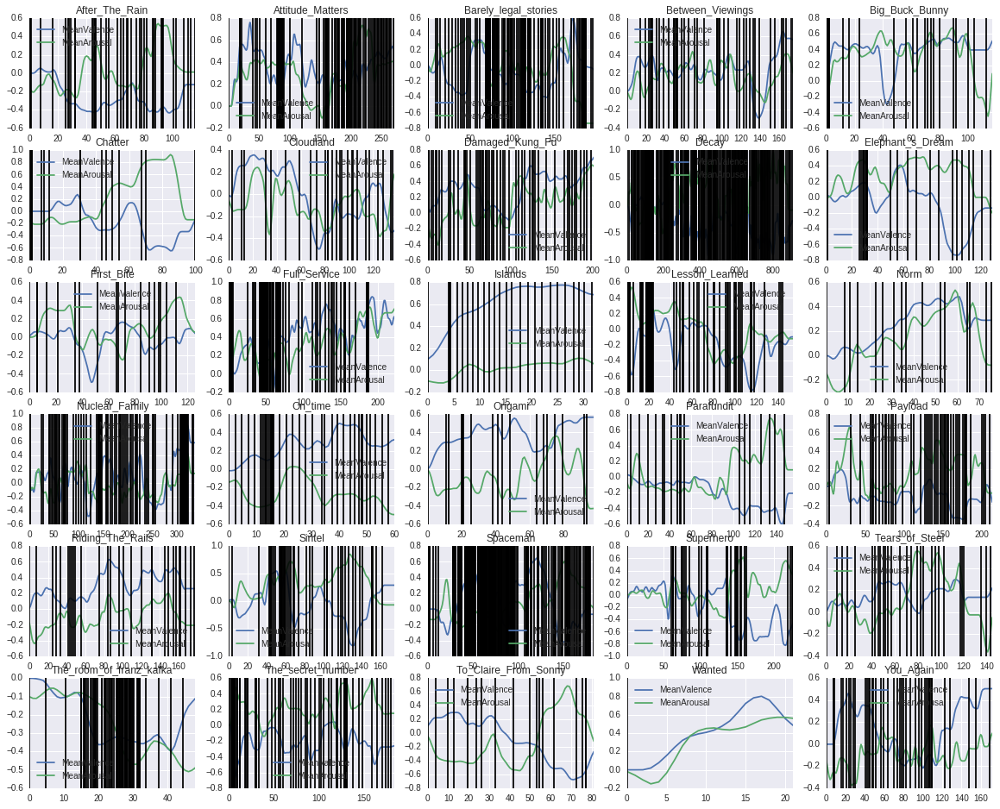

In [97]:
fix, axes = plt.subplots(figsize=(20,16))
for ii, mov in enumerate(movieNames):
    if (ii+1 > 30):
        plt.subplot(6,5,ii)
    else :
        plt.subplot(6,5,ii+1)
    df = getAnnotationDf(mov)
    df[['MeanValence','MeanArousal']].plot(ax=plt.gca(),title=mov)
    cuts = getShotDf(mov)['time']
    for i in range(len(cuts)):
        plt.axvline(x=cuts[i],linestyle='-',color='black')



## Fear Annotations

In [98]:
def getFearDf(movname):
    filename = os.path.join(med2017fearFolder, movname + '-MEDIAEVAL2017-fear.txt')
    annotation = np.genfromtxt(filename, names=True, delimiter='\t', dtype=None)
    df = pd.DataFrame(annotation)
    return df


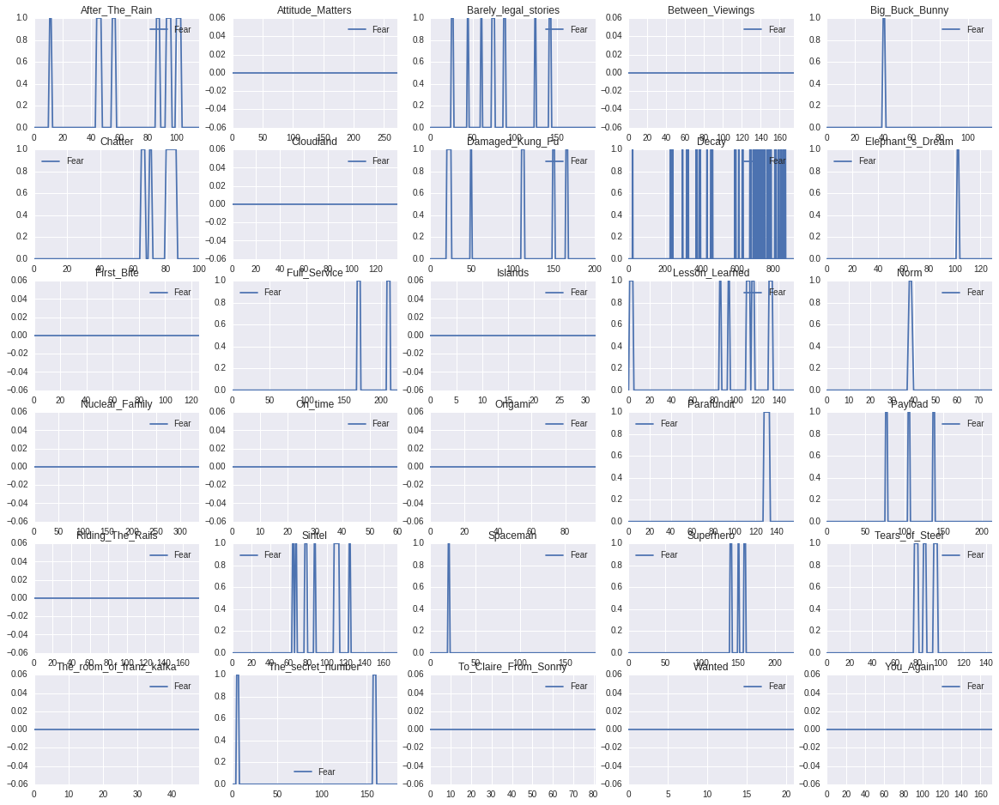

In [99]:
fix, axes = plt.subplots(figsize=(20,16))
for ii, mov in enumerate(movieNames):
    plt.subplot(6,5,ii+1)
    df = getFearDf(mov)
    df[['Fear']].plot(ax=plt.gca(),title=mov)

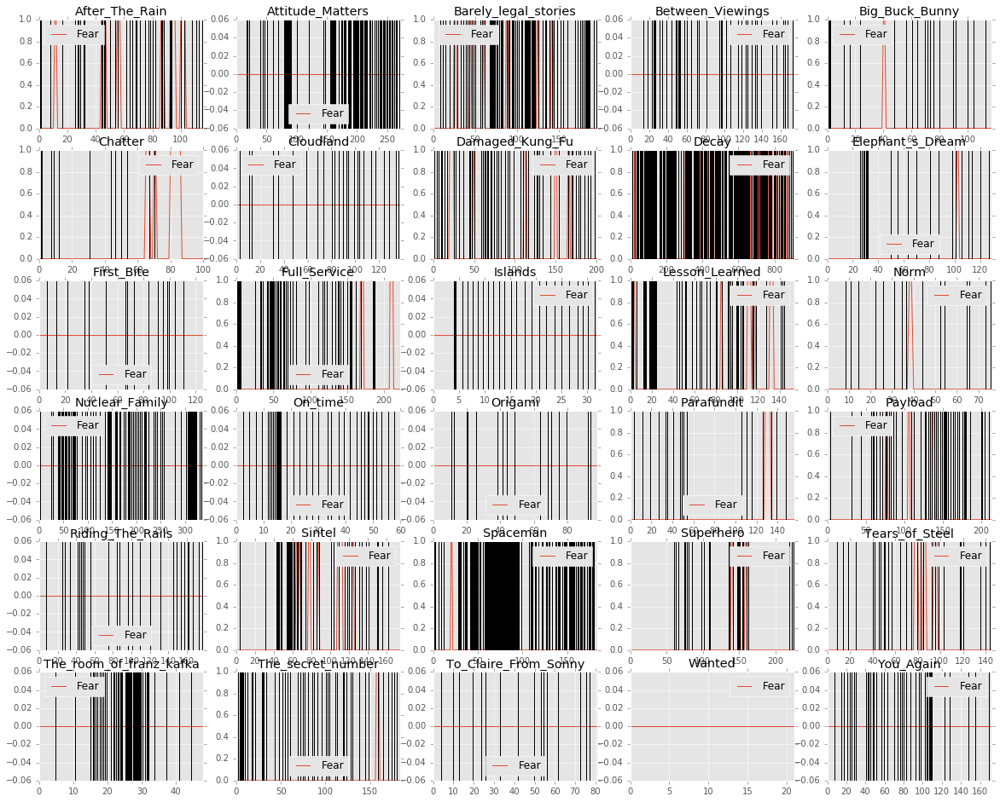

In [110]:
fix, axes = plt.subplots(figsize=(20,16))
for ii, mov in enumerate(movieNames):
    plt.subplot(6,5,ii+1)
    df = getFearDf(mov)
    df[['Fear']].plot(ax=plt.gca(),title=mov)
    cuts = getShotDf(mov)['time']
    for i in range(len(cuts)): #### assumption about cut time is wrong
        plt.axvline(x=cuts[i],linestyle='-',color='black')


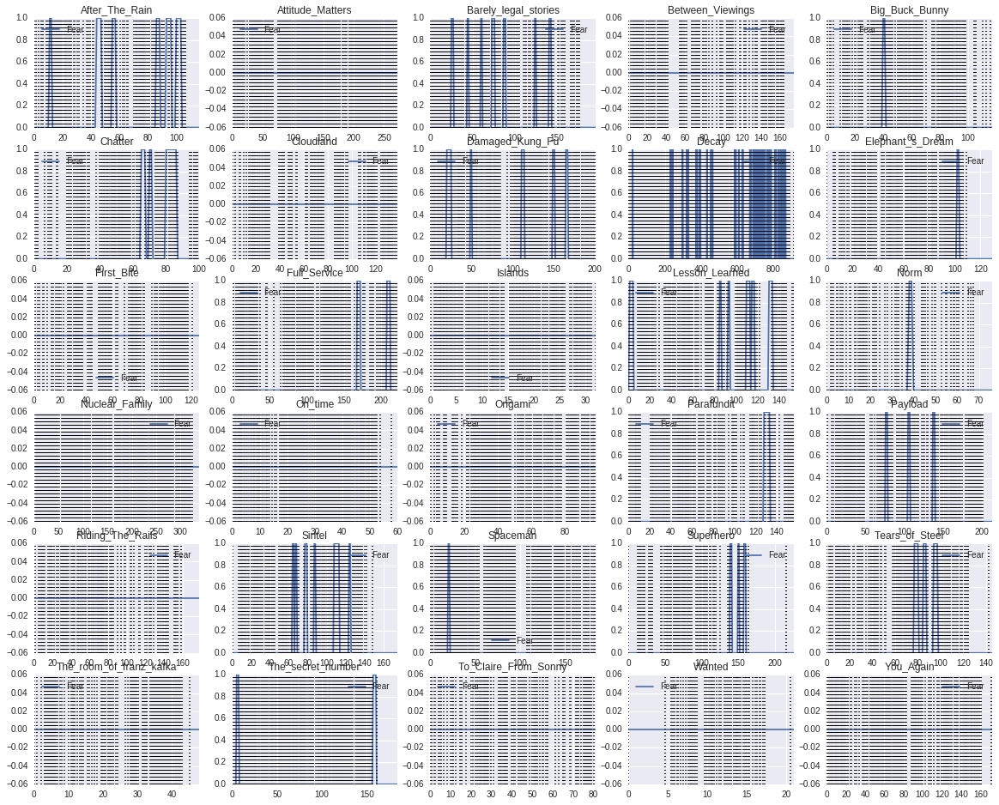

In [100]:
fix, axes = plt.subplots(figsize=(20,16))
for ii, mov in enumerate(movieNames):
    plt.subplot(6,5,ii+1)
    df = getFearDf(mov)
    df[['Fear']].plot(ax=plt.gca(),title=mov)
    cuts = getShotDf(mov)['time']
    for i in range(len(cuts)):
        x=cuts[i]/5   ## conversion of time to sliding windows with 5 
        plt.axvline(x,linestyle=':',color='black')


## Audio Features


In [144]:
def getAudioDf(moviename,folder=med2017audiofolder):
    if 'TestSet' in folder:
        files = glob.glob(folder+moviename+'/audio_features/*.csv')
    else:
        files = glob.glob(folder+moviename+'/*.csv')
    files = sorted(files)
    files
    alist = []
    for fname in files:
        f=open(fname,'r')
        h = []
        for l in f :
            if '@attribute' in l:
                h.append(l.split()[1])
            elif l == '\n':
                l
            elif l[0] =='@':
                l
            else:
                alist.append(map(float,l.split(',')[1:])) #first attribute is string ,skipped
        f.close()
    
    return pd.DataFrame(alist,columns=h[1:])

## Visual Features

In [103]:
visual_feat = ['acc', 'cedd', 'cl', 'eh', 'fc6', 'fcth', 
               'gabor', 'jcd', 'lbp', 'sc', 'tamura'   ]
visual_feat_wofc16 = ['acc', 'cedd', 'cl', 'eh', 'fcth', 
               'gabor', 'jcd', 'lbp', 'sc', 'tamura'   ]

In [106]:
def getVisFeatureDf(moviename,typename,folder=med2017visualFeaturesfolder):
    files = glob.glob(folder+moviename+'/'+typename+'/*.txt')
    files = sorted(files)
    alist = []
    for fname in files:
        f=open(fname,'r')
        for l in f:
            alist.append(map(float,l.split(',')))
        f.close()
    return pd.DataFrame(alist)

def getAvgVisFeatureDf(moviename,typename,folder=med2017visualFeaturesfolder):
    df = getVisFeatureDf(moviename,typename,folder)
    dfwindow = df.rolling(10).mean()[9::5] ############### start with 9
    dfwindow.reset_index(inplace=True)
    dfwindow.drop('index',axis=1,inplace=True)
    return dfwindow

def getAvgVisFeatListDf(moviename,featlist,folder=med2017visualFeaturesfolder):
    df = getVisFeatureDf(moviename,featlist[0],folder)
    for feat in featlist[1:]:
        tdf = getVisFeatureDf(moviename,feat,folder)
        df = pd.concat([df,tdf],axis=1)
    
    dfwindow = df.rolling(10).mean()[9::5] ############### start with 9
    dfwindow.reset_index(inplace=True)
    dfwindow.drop('index',axis=1,inplace=True)
    dfwindow.columns=list(range(len(dfwindow.columns)))
    return dfwindow

In [107]:
sum([len(getAnnotationDf(m)) for m in movieNames ])

5274

In [108]:
sum([len(getAudioDf(m)) for m in movieNames ])

5264

In [109]:
sum([len(getVisFeatureDf(m,'cl')) for m in movieNames ])

26589

In [110]:
sum([len(getAvgVisFeatureDf(m,'cl')) for m in movieNames ])

5276

In [111]:
df = getVisFeatureDf(movieNames[0],'cl')
#df = getAvgVisFeatureDf(movieNames[0],'cl')
#df = getAvgVisFeatListDf(movieNames[0],['cl','eh'])
#df.hist()
df.head(10)

,0,1,2,3,4,5,6,7,8,9,...,23,24,25,26,27,28,29,30,31,32
0,2.0,16.0,16.0,16.0,16.0,16.0,16.0,16.0,16.0,16.0,...,16.0,16.0,16.0,16.0,32.0,16.0,16.0,16.0,16.0,16.0
1,2.0,15.0,15.0,16.0,16.0,16.0,15.0,15.0,15.0,16.0,...,16.0,16.0,16.0,16.0,31.0,16.0,16.0,16.0,16.0,16.0
2,15.0,16.0,14.0,14.0,16.0,16.0,16.0,15.0,16.0,15.0,...,16.0,15.0,16.0,16.0,21.0,15.0,16.0,16.0,16.0,16.0
3,6.0,17.0,15.0,8.0,16.0,12.0,18.0,16.0,16.0,16.0,...,15.0,15.0,16.0,15.0,27.0,15.0,16.0,17.0,15.0,17.0
4,3.0,16.0,15.0,11.0,16.0,12.0,16.0,16.0,15.0,16.0,...,16.0,15.0,16.0,15.0,30.0,16.0,16.0,17.0,16.0,16.0
5,4.0,14.0,16.0,13.0,15.0,13.0,16.0,15.0,16.0,15.0,...,15.0,16.0,15.0,15.0,29.0,16.0,16.0,16.0,16.0,16.0
6,3.0,14.0,16.0,13.0,15.0,12.0,16.0,15.0,16.0,15.0,...,16.0,16.0,16.0,16.0,31.0,16.0,16.0,16.0,16.0,16.0
7,4.0,14.0,16.0,13.0,15.0,12.0,16.0,15.0,16.0,15.0,...,16.0,16.0,16.0,16.0,31.0,16.0,16.0,16.0,16.0,16.0
8,4.0,14.0,16.0,13.0,15.0,12.0,16.0,15.0,16.0,15.0,...,16.0,16.0,16.0,16.0,31.0,16.0,16.0,16.0,16.0,16.0
9,3.0,15.0,16.0,13.0,15.0,12.0,16.0,15.0,16.0,15.0,...,16.0,16.0,16.0,16.0,31.0,16.0,16.0,16.0,16.0,16.0


In [112]:
#df = getAvgVisFeatListDf(movieNames[0],['fc6'])
#df = getVisFeatureDf(movieNames[0],'fc6')
#df.describe()

## Low Level Cinematographic Features
fps değerlerine göre, feature çıkarma key frame seçme ve averaging tekrar yapılacak.

In [113]:
def getLowFeatureDf(movname):
    fname = movname +'.mp4continous_features.txt'
    df = pd.DataFrame(np.genfromtxt( os.path.join(pathcontfeatures,fname)))
    df.columns = ['time','framemean','huemean','satmean','valmean', 'redmean','greenmean','bluemean', 'lummean','motion']
    return df

def getLowFeature10SecDf(movname):
    pdf = getLowFeatureDf(movname)
    
    dfwindow = pdf.rolling(10).mean()[9::5]
    dfwindow.reset_index(inplace=True)
    dfwindow.drop('index',axis=1,inplace=True)
    dfwindow.drop('time',axis=1,inplace=True)
    return dfwindow

def getMovieListLowFeatFearDf(movieNames):
    X = getLowFeature10SecDf(movieNames[0])
    y = getFearDf(movieNames[0]).Fear[:len(X)]

    for mov in movieNames[1:]:
        tX=getLowFeatureDf(mov)
        ty=getFearDf(mov).Fear[:len(tX)]
        X = X.append(tX)
        y = y.append(ty)
        if (X.shape != y.shape):
            print mov, X.shape, y.shape
    return X,y

In [114]:
#getLowFeatureDf(movieNames[1]).head(10)[2::2]

In [115]:
#print getLowFeatureDf(movieNames[1]).head(10)
#print getLowFeatureDf(movieNames[1]).head(10).mean()
print getLowFeature10SecDf(movieNames[1]).head(10)

   framemean    huemean     satmean     valmean    redmean  greenmean  \
0       11.0  16.266390  108.533860   24.615390   5.417613   5.983095   
1        9.5  10.111689   65.248124   15.309475   7.196943   7.676144   
2       14.1   7.779963   10.971608   15.279160  14.210921  14.116898   
3       54.6  31.491614   36.296284   59.702565  52.819005  54.486605   
4       79.8  47.335400   74.969860   89.290460  75.284470  79.210160   
5       70.7  46.443380   82.062840   80.176950  66.029620  69.923720   
6       73.1  49.213990   78.506800   82.417040  69.214910  72.537860   
7       75.4  45.503130   70.678890   83.767210  70.378780  75.304340   
8       79.0  31.727480   83.240130   92.335810  65.965150  76.843300   
9       84.5  24.291420  101.637440  103.255080  66.305130  79.824300   

     bluemean  lummean     motion  
0   24.605360      0.7  26.035474  
1   15.304023      0.1   4.688359  
2   14.986898      6.0  10.187818  
3   57.096935     50.0  15.618866  
4   84.692030   

# Face Features

In [116]:
def getFaceFeature(movie):
    df  = getfacedf(movie)
    dfwindow = df.rolling(window=10).mean()[10::5]
    dfwindow.reset_index(inplace=True)
    dfwindow.drop('index',axis=1,inplace=True)
    return dfwindow

In [118]:
getFaceFeature('Islands').head()

,noface,fcx,fcy,topratio,bottomratio,leftratio,rightratio,fheight,fwidth,farea
0,0.0,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000
1,0.2,1.939815e-02,0.010937,0.086667,0.125463,0.065937,0.087813,3.879630e-02,0.021875,0.004761
2,0.2,1.939815e-02,0.010937,0.086667,0.125463,0.065937,0.087813,3.879630e-02,0.021875,0.004761
3,0.0,1.387779e-18,0.000000,0.000000,0.000000,0.000000,0.000000,2.775558e-18,0.000000,0.000000
4,0.0,1.387779e-18,0.000000,0.000000,0.000000,0.000000,0.000000,2.775558e-18,0.000000,0.000000


In [329]:
facesframefold = "/home/yt/Desktop/cvpr2014/repro/mediaeval/data/dataset/facepreds/"

In [330]:
movname = "Chatter"
people = pd.read_csv(facesframefold+movname+"-faces.csv",header=None)
people.describe()


,0,2,3,4,5,6,7,8,9,10,...,124,125,126,127,128,129,130,131,132,133
count,212.000000,212.000000,212.000000,212.000000,212.000000,212.000000,212.000000,212.000000,212.000000,212.000000,...,212.000000,212.000000,212.000000,212.000000,212.000000,212.000000,212.000000,212.000000,212.000000,212.000000
mean,267.679245,47.278302,286.504717,150.358491,389.721698,-0.077605,0.011628,0.026790,-0.061964,-0.087117,...,0.002727,0.014607,-0.003463,-0.046088,-0.176437,-0.070225,0.063524,-0.035260,0.014197,-0.006016
std,104.398439,29.080260,105.387639,40.852802,77.134110,0.058455,0.035620,0.059660,0.033446,0.035857,...,0.061664,0.038144,0.036684,0.039997,0.039285,0.029905,0.028596,0.035126,0.044568,0.036995
min,4.000000,0.000000,55.000000,42.000000,163.000000,-0.214004,-0.078092,-0.085899,-0.170612,-0.238974,...,-0.114524,-0.073215,-0.096212,-0.132870,-0.281628,-0.146385,-0.006588,-0.117541,-0.075514,-0.084164
25%,178.750000,26.000000,187.000000,117.500000,328.750000,-0.125296,-0.014003,-0.017924,-0.084153,-0.109188,...,-0.049754,-0.009230,-0.028451,-0.074089,-0.201610,-0.088622,0.045854,-0.062659,-0.015307,-0.038248
50%,261.500000,39.000000,270.000000,152.000000,369.000000,-0.067294,0.008819,0.005029,-0.059693,-0.084786,...,-0.011366,0.013847,-0.007399,-0.051048,-0.178779,-0.070848,0.064512,-0.030642,0.005837,-0.004082
75%,361.250000,64.000000,365.000000,177.500000,454.000000,-0.029192,0.031808,0.067336,-0.040020,-0.061182,...,0.052099,0.036645,0.023650,-0.022312,-0.152256,-0.051858,0.084309,-0.011042,0.032493,0.020714
max,487.000000,146.000000,563.000000,260.000000,626.000000,0.024964,0.159317,0.161212,0.019561,0.005951,...,0.153953,0.113884,0.100701,0.083711,-0.063737,0.032691,0.133036,0.081249,0.138578,0.086128


In [358]:
people.head(32)

,0,1,2,3,4,5,6,7,8,9,...,124,125,126,127,128,129,130,131,132,133
0,4,other,105,278,179,353,-0.185030,0.008859,0.033949,-0.131595,...,0.153953,-0.007156,-0.043522,-0.016516,-0.194620,-0.031490,0.120523,-0.032774,0.068560,0.011354
1,5,other,118,313,154,349,-0.169141,0.014448,0.132963,-0.069434,...,0.146014,0.002492,-0.038670,-0.020559,-0.201985,-0.054442,0.060438,-0.059246,0.074385,0.061074
2,113,karoline,47,270,202,425,-0.035523,0.048640,-0.035480,-0.005824,...,-0.056112,0.060494,0.012013,-0.057838,-0.191620,-0.084892,0.091667,-0.002641,-0.029002,-0.016566
3,114,other,146,278,221,353,-0.094587,0.097428,0.103004,-0.038761,...,0.006162,0.109137,0.036173,-0.049004,-0.167887,-0.121404,0.010141,-0.117452,0.028679,-0.012593
4,115,karoline,53,282,182,411,-0.038757,0.008779,0.010606,-0.006416,...,-0.059742,0.036600,-0.021771,-0.053814,-0.190942,-0.095943,0.084765,-0.000523,0.016013,0.008745
5,118,other,32,55,140,163,-0.022053,-0.027766,0.014698,-0.010144,...,-0.032187,0.106726,0.009933,-0.054485,-0.188204,-0.010889,0.080560,0.003096,-0.034196,0.007449
6,121,karoline,0,187,92,294,-0.000853,-0.023836,-0.064311,-0.056940,...,-0.016146,0.067007,0.026167,-0.118395,-0.252840,-0.089671,-0.006296,-0.068180,-0.068565,-0.017621
7,122,other,108,398,170,460,-0.070176,0.031924,0.056141,-0.082816,...,-0.023019,0.090178,-0.043108,-0.101693,-0.187126,-0.139653,0.025945,-0.075777,0.044158,0.021770
8,123,other,30,337,105,411,-0.034715,-0.008053,0.042952,-0.108854,...,0.070484,-0.008769,-0.031336,-0.091931,-0.156733,-0.082900,0.016941,-0.019712,0.119504,0.058240
9,123,other,94,405,156,467,-0.089074,0.065142,0.074078,-0.104860,...,0.009370,0.088188,-0.023952,-0.063741,-0.197858,-0.118346,0.022145,-0.068257,0.027456,0.015516


In [362]:
people[people.duplicated(0,keep=False)]

,0,1,2,3,4,5,6,7,8,9,...,124,125,126,127,128,129,130,131,132,133
8,123,other,30,337,105,411,-0.034715,-0.008053,0.042952,-0.108854,...,0.070484,-0.008769,-0.031336,-0.091931,-0.156733,-0.082900,0.016941,-0.019712,0.119504,0.058240
9,123,other,94,405,156,467,-0.089074,0.065142,0.074078,-0.104860,...,0.009370,0.088188,-0.023952,-0.063741,-0.197858,-0.118346,0.022145,-0.068257,0.027456,0.015516
28,142,tom,76,354,166,444,-0.074419,0.026630,-0.006901,-0.035540,...,0.110042,0.008824,-0.014215,-0.055782,-0.181461,-0.068900,0.071291,-0.088190,0.084063,-0.000224
29,142,other,6,265,42,301,-0.098807,0.057971,-0.023332,-0.058067,...,0.077163,0.051914,0.057775,0.024200,-0.119287,-0.138686,0.096464,-0.062788,0.008711,0.021591
39,156,other,10,210,139,339,-0.041259,-0.017372,0.039531,-0.109432,...,0.052082,0.002924,-0.021979,-0.098338,-0.121956,-0.087843,0.021727,-0.057455,0.123666,0.043005
40,156,other,110,325,239,454,-0.094949,0.047883,0.097897,-0.051849,...,-0.030003,0.094835,-0.039015,-0.051759,-0.189465,-0.105662,0.012480,-0.070311,0.022986,0.018150
45,167,other,10,225,139,354,-0.065495,0.019002,0.030814,-0.087263,...,0.097104,0.016233,-0.001707,-0.087374,-0.126038,-0.101982,0.025456,-0.100151,0.110634,0.065201
46,167,other,128,342,235,450,-0.073372,0.093732,0.108862,-0.040452,...,0.007707,0.108042,0.023025,-0.040015,-0.187991,-0.109228,0.022787,-0.100784,-0.010369,-0.012502
180,412,tom,96,295,171,370,-0.173498,-0.010473,-0.010755,-0.048850,...,0.101333,0.006947,-0.060814,-0.027929,-0.163753,-0.078095,0.073422,-0.052830,0.130495,0.016050
181,412,other,78,453,114,489,-0.151028,-0.014767,0.096390,-0.111576,...,0.038220,0.005576,0.024701,-0.007785,-0.160211,-0.109494,0.049026,-0.066726,0.074279,0.086128


In [331]:
people.head()

,0,1,2,3,4,5,6,7,8,9,...,124,125,126,127,128,129,130,131,132,133
0,4,NaN,105,278,179,353,-0.185030,0.008859,0.033949,-0.131595,...,0.153953,-0.007156,-0.043522,-0.016516,-0.194620,-0.031490,0.120523,-0.032774,0.068560,0.011354
1,5,NaN,118,313,154,349,-0.169141,0.014448,0.132963,-0.069434,...,0.146014,0.002492,-0.038670,-0.020559,-0.201985,-0.054442,0.060438,-0.059246,0.074385,0.061074
2,113,karoline,47,270,202,425,-0.035523,0.048640,-0.035480,-0.005824,...,-0.056112,0.060494,0.012013,-0.057838,-0.191620,-0.084892,0.091667,-0.002641,-0.029002,-0.016566
3,114,NaN,146,278,221,353,-0.094587,0.097428,0.103004,-0.038761,...,0.006162,0.109137,0.036173,-0.049004,-0.167887,-0.121404,0.010141,-0.117452,0.028679,-0.012593
4,115,karoline,53,282,182,411,-0.038757,0.008779,0.010606,-0.006416,...,-0.059742,0.036600,-0.021771,-0.053814,-0.190942,-0.095943,0.084765,-0.000523,0.016013,0.008745


In [332]:
people = people.fillna('other')

In [335]:
people[people[1] == 'linn']
people[1].unique()

array(['other', 'karoline', 'tom', 'linn'], dtype=object)

In [341]:
karoline = people[people[1] == 'karoline']
tom = people[people[1] == 'tom']
linn = people[people[1] == 'linn']
other = people[people[1] == 'other']

In [342]:
other.head()

,0,1,2,3,4,5,6,7,8,9,...,124,125,126,127,128,129,130,131,132,133
0,4,other,105,278,179,353,-0.185030,0.008859,0.033949,-0.131595,...,0.153953,-0.007156,-0.043522,-0.016516,-0.194620,-0.031490,0.120523,-0.032774,0.068560,0.011354
1,5,other,118,313,154,349,-0.169141,0.014448,0.132963,-0.069434,...,0.146014,0.002492,-0.038670,-0.020559,-0.201985,-0.054442,0.060438,-0.059246,0.074385,0.061074
3,114,other,146,278,221,353,-0.094587,0.097428,0.103004,-0.038761,...,0.006162,0.109137,0.036173,-0.049004,-0.167887,-0.121404,0.010141,-0.117452,0.028679,-0.012593
5,118,other,32,55,140,163,-0.022053,-0.027766,0.014698,-0.010144,...,-0.032187,0.106726,0.009933,-0.054485,-0.188204,-0.010889,0.080560,0.003096,-0.034196,0.007449
7,122,other,108,398,170,460,-0.070176,0.031924,0.056141,-0.082816,...,-0.023019,0.090178,-0.043108,-0.101693,-0.187126,-0.139653,0.025945,-0.075777,0.044158,0.021770


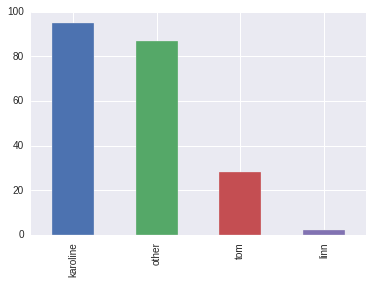

In [343]:
people[1].value_counts().plot(kind='bar')

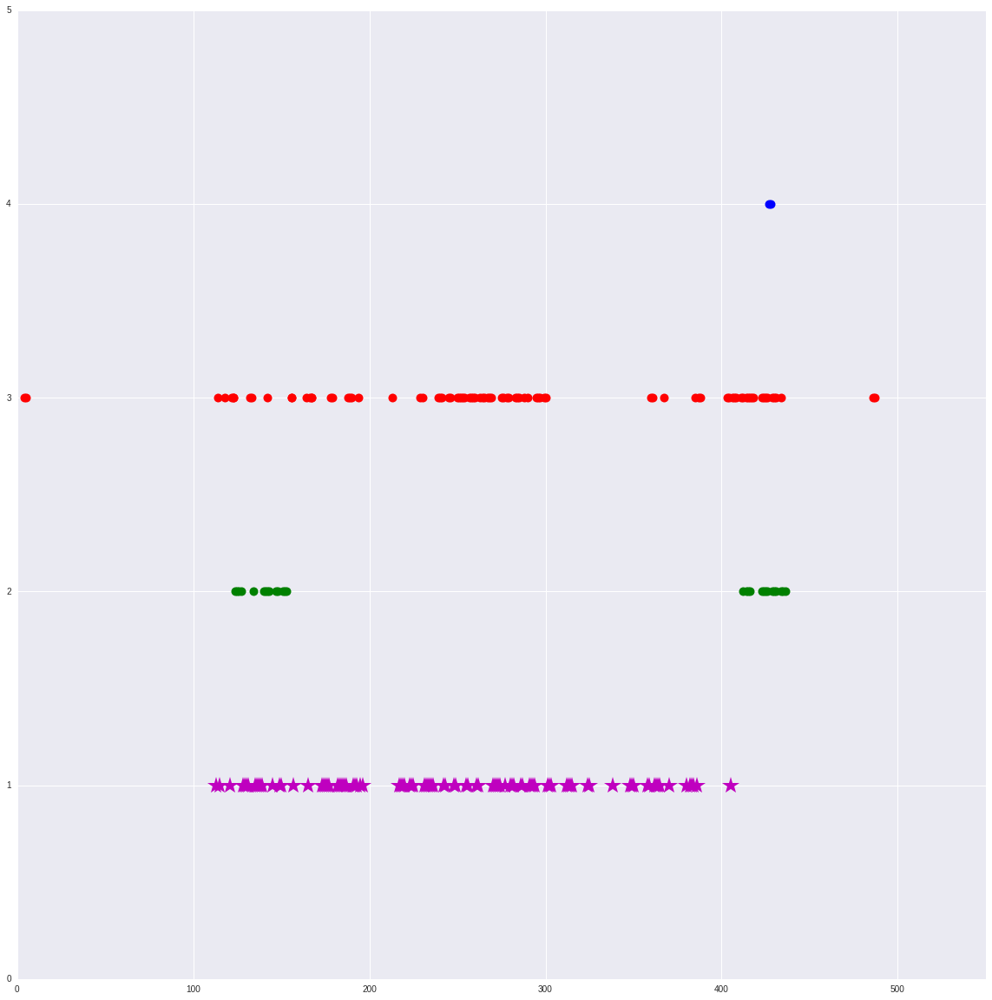

In [345]:
plt.figure(figsize=(20,20))
plt.axis([0,550,0,5])
plt.plot(karoline[0],np.ones(len(karoline)),'m*', ms=20)
plt.plot(tom[0],np.ones(len(tom))*2,'g.', ms=20)
plt.plot(other[0],np.ones(len(other))*3,'r.', ms=20)
plt.plot(linn[0],np.ones(len(linn))*4,'b.', ms=20)

ValueError: could not convert string to float: karoline

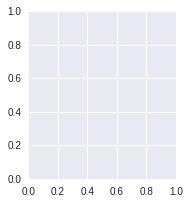

In [322]:
plt.figure(1, figsize=(9, 3))

plt.subplot(131)
plt.bar(['karoline','tom'], [karoline[0].all(),tom[0].all()])
plt.subplot(132)
plt.scatter(['karoline','tom'], [karoline[0],tom[0]])
plt.subplot(133)
plt.plot(['karoline','tom'], [karoline[0],tom[0]])
plt.suptitle('Categorical Plotting')
plt.show()


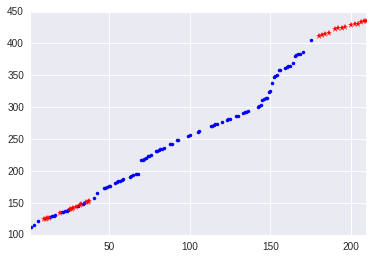

In [253]:
karoline[0].plot(style='b.')
tom[0].plot(style='r*')


## Train and Test set creation

In [119]:
def getFeatureswAnnotationsDf(movie,featlist=visual_feat_wofc16):
    Xv = getAvgVisFeatListDf(movie,featlist)
    Xa = getAudioDf(movie)
    Xd = getAvgVisFeatListDf(movie,['fc6'])
    Xl = getLowFeature10SecDf(movie)
    Xf = getFaceFeature(movie)
    y = getFearDf(movie)[['Fear']]

    return Xv,Xa,Xd,Xl,Xf,y

In [120]:
Xv,Xa,Xd,Xl,Xf,y = getFeatureswAnnotationsDf('Attitude_Matters')

In [121]:
Xv.shape,Xa.shape,Xd.shape,Xd.shape,Xl.shape,Xf.shape,y.shape

((273, 1271),
 (273, 1583),
 (273, 4096),
 (273, 4096),
 (282, 9),
 (273, 10),
 (273, 1))

In [145]:
def getFeatureswAnnotationsDf(movieNames,featlist=visual_feat_wofc16,folder=med2017visualFeaturesfolder):
    Xv = getAvgVisFeatListDf(movieNames[0],featlist)
    Xa = getAudioDf(movieNames[0])
    Xd = getAvgVisFeatListDf(movieNames[0],['fc6'])
    Xl = getLowFeature10SecDf(movieNames[0])
    Xf = getFaceFeature(movieNames[0])
    y = getAnnotationDf(movieNames[0])[['MeanValence','MeanArousal']]
    
    mlen = min(len(Xv),len(Xa), len(Xd), len(Xl),len(Xf),len(y))
    
    Xv = Xv[:mlen]
    Xa = Xa[:mlen]
    Xd = Xd[:mlen]
    Xl = Xl[:mlen]
    Xf = Xf[:mlen]
    y = y[:mlen]
    
    for mov in movieNames[1:]:
        tXv = getAvgVisFeatListDf(mov,featlist)
        tXa = getAudioDf(mov)
        tXd = getAvgVisFeatListDf(mov,['fc6'])
        tXl = getLowFeature10SecDf(mov)
        tXf = getFaceFeature(mov)
        ty = getAnnotationDf(mov)[['MeanValence','MeanArousal']]
        
        mlen = min(len(tXv),len(tXa),len(tXd),len(ty))
        tXv = tXv[:mlen]
        tXa = tXa[:mlen]
        tXd = tXd[:mlen]
        tXl = tXl[:mlen]
        tXf = tXf[:mlen] 
        ty = ty[:mlen]
        
        Xv  = Xv.append(tXv)
        Xa  = Xa.append(tXa)
        Xd = Xd.append(tXd)
        Xl = Xl.append(tXl)
        Xf = Xf.append(tXf)
        y  = y.append(ty)
        
    return Xv,Xa,Xd,Xl,Xf,y

In [147]:
def df2mat(df):
    return df.as_matrix().reshape((len(df),))


# Regression work

In [126]:
#trainlist, testlist=gettraintestmovielist(2,movgroups_wodecay)  # index 1 olanları test , diğerlerini train yapan fonksiyon
#trainlist, testlist
#for ii in range(len(movgroups)):
#    trnlist, tstlist=gettraintestmovielist(ii)


In [127]:
#%%time
#allXv,allXa,allXd,ally = getFeatureswAnnotationsDf(movieNames)
#print(allXv.shape,allXa.shape,allXd.shape,ally.shape)

In [130]:
#trainlist, testlist=gettraintest2movielist(2)  # index X olanları test , diğerlerini train yapan fonksiyon
#trainlist, testlist=gettraintestmovielist(2)  # index X olanları test , diğerlerini train yapan fonksiyon
#tXv,tXa,tXd,tXl,ty = getFeatureswAnnotationsDf(trainlist)
#testXv, testXa, testXd, testXl, testy = getFeatureswAnnotationsDf(testlist)
#print(testXv.shape, testXa.shape,testXd.shape,testXd.shape, testy.shape)


((4556, 1271), (4556, 1583), (4556, 4096), (4556, 9), (4556, 1))
((708, 1271), (708, 1583), (708, 4096), (708, 4096), (708, 1))


In [207]:
#training on whole dev set use
# movieNames,testmovieNames
#tXv,tXa,tXd,tXl,tXf,ty = getFeatureswAnnotationsDf(movieNames)
#print(tXv.shape,tXa.shape,tXd.shape,tXl.shape,ty.shape)

#testXv, testXa, testXd, testXl, testy = getFeatureswAnnotationsDf(testmovieNames)
#print(testXv.shape, testXa.shape,testXd.shape,testXd.shape, testy.shape)


((5264, 1271), (5264, 1583), (5264, 4096), (5264, 9), (5264, 2))


In [89]:
X_train, X_test, y_train, y_test = train_test_split(tXv, ty,test_size=0.2, random_state=0)

In [90]:
Xa_train, Xa_test, ya_train, ya_test = train_test_split(tXa, ty,test_size=0.2, random_state=0)

In [91]:
Xd_train, Xd_test, yd_train, yd_test = train_test_split(tXd, ty,test_size=0.2, random_state=0)

In [92]:
Xl_train, Xl_test, yl_train, yl_test = train_test_split(tXl, ty,test_size=0.2, random_state=0)
Xl_train.shape, Xl_test.shape, yl_train.shape, yl_test.shape

((3644, 9), (912, 9), (3644, 2), (912, 2))

## Linear Regression - Valence

In [93]:
%%time
from sklearn import  linear_model
from sklearn.metrics import mean_squared_error, r2_score

# Create linear regression object
visual_regr = linear_model.LinearRegression()
audio_regr = linear_model.LinearRegression()
nn_regr = linear_model.LinearRegression()
llf_regr = linear_model.LinearRegression() #low level features

# Train the model using the training sets
visual_regr.fit(X_train, y_train[['MeanValence']].as_matrix().reshape((len(y_train))))
audio_regr.fit(Xa_train, ya_train[['MeanValence']].as_matrix().reshape((len(ya_train))))
nn_regr.fit(Xd_train, yd_train[['MeanValence']].as_matrix().reshape((len(yd_train))))
llf_regr.fit(Xl_train, yl_train[['MeanValence']].as_matrix().reshape((len(yl_train))))

# Make predictions using the testing set
visual_y_pred = visual_regr.predict(X_test)
audio_y_pred = audio_regr.predict(Xa_test)
nn_y_pred = nn_regr.predict(Xd_test)
llf_y_pred = llf_regr.predict(Xl_test)



CPU times: user 51.4 s, sys: 120 ms, total: 51.5 s
Wall time: 25.9 s


In [96]:
d = {'one' : [1., 2., 3., 4.],'two' : [4., 3., 2., 1.]}
pd.DataFrame(d)
pd.DataFrame(d, index=['a', 'b', 'c', 'd'])


,one,two
a,1.0,4.0
b,2.0,3.0
c,3.0,2.0
d,4.0,1.0


In [104]:
valencedic = { 
    'visual feat.':[mean_squared_error(df2mat(y_test[['MeanValence']]), visual_y_pred), pearsonr(df2mat(y_test[['MeanValence']]),visual_y_pred)[0] ],
     'audio feat.':[mean_squared_error(df2mat(y_test[['MeanValence']]), audio_y_pred), pearsonr(df2mat(y_test[['MeanValence']]),audio_y_pred)[0] ],
     'deep feat.':[mean_squared_error(df2mat(y_test[['MeanValence']]), nn_y_pred), pearsonr(df2mat(y_test[['MeanValence']]),nn_y_pred)[0] ],
     'low level feat.':[mean_squared_error(df2mat(y_test[['MeanValence']]), llf_y_pred), pearsonr(df2mat(y_test[['MeanValence']]),llf_y_pred)[0] ],
             }
linearreg_score = pd.DataFrame(valencedic, index=['MSE', 'PCC'])
linearreg_score

,audio feat.,deep feat.,low level feat.,visual feat.
MSE,0.258458,8.197371e+15,0.096040,0.839452
PCC,0.327509,-1.645861e-02,0.411557,0.253936


In [156]:
# The coefficients
print('Visual Coefficients: \n', visual_regr.coef_)
# The mean squared error
print("Mean squared error: %.2f"% mean_squared_error(df2mat(y_test[['MeanValence']]), visual_y_pred))
# Explained variance score: 1 is perfect prediction
print('Variance score: %.2f' % r2_score(df2mat(y_test[['MeanValence']]),visual_y_pred))
# Pearson coeff
print('pearson score  ',pearsonr(df2mat(y_test[['MeanValence']]),visual_y_pred))
print
print('Audio Coefficients: \n', audio_regr.coef_)
# The mean squared error
print("Mean squared error: %.2f"
      % mean_squared_error(df2mat(ya_test[['MeanValence']]), audio_y_pred))
# Explained variance score: 1 is perfect prediction
print('Variance score: %.2f' % r2_score(df2mat(ya_test[['MeanValence']]),audio_y_pred))
print('pearson score  ',pearsonr(df2mat(ya_test[['MeanValence']]),audio_y_pred))
print
print('FC16 Coefficients: \n', nn_regr.coef_)
# The mean squared error
print("Mean squared error: %.2f"
      % mean_squared_error(df2mat(yd_test[['MeanValence']]), nn_y_pred))
# Explained variance score: 1 is perfect prediction
print('Variance score: %.2f' % r2_score(df2mat(yd_test[['MeanValence']]),nn_y_pred))

print('pearson score  ',pearsonr(df2mat(yd_test[['MeanValence']]),nn_y_pred))

print('Low Level Cinematographic: \n', llf_regr.coef_)
# The mean squared error
print("Mean squared error: %.2f"
      % mean_squared_error(df2mat(yl_test[['MeanValence']]), llf_y_pred))
# Explained variance score: 1 is perfect prediction
print('Variance score: %.2f' % r2_score(df2mat(yl_test[['MeanValence']]),llf_y_pred))

print('pearson score  ',pearsonr(df2mat(yl_test[['MeanValence']]),llf_y_pred))

('Visual Coefficients: \n', array([ -1.74060522e-02,   3.69639603e-02,   1.55390329e-02, ...,
         1.22527228e-03,  -9.04845107e-04,   4.88794055e-05]))
Mean squared error: 0.84
Variance score: -6.27
('pearson score  ', (0.25393645213333771, 6.9069263881087338e-15))

('Audio Coefficients: \n', array([  3.06607953e-02,  -1.82325273e-02,  -3.19137275e+02, ...,
        -9.56957917e-04,  -1.70285576e+01,   0.00000000e+00]))
Mean squared error: 0.26
Variance score: -1.24
('pearson score  ', (0.3275086370542169, 3.0384384446345937e-24))

('FC16 Coefficients: \n', array([  2831664.48077852,   6893762.64101596,  -2521597.59440709, ...,
         3867838.41300851, -12537547.56610266,  -3833028.60989121]))
Mean squared error: 8197370788610131.00
Variance score: -70978017877955008.00
('pearson score  ', (-0.016458609862297819, 0.61961853043485204))
('Low Level Cinematographic: \n', array([-0.07326964,  0.0008593 , -0.00322647,  0.01542661, -0.00134785,
        0.03842486,  0.02221975, -0.00264

## Grid Search on Visual Features- Valence

In [132]:
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.svm import SVR
from sklearn.preprocessing import MinMaxScaler
from sklearn.pipeline import Pipeline
from sklearn.pipeline import make_pipeline
from sklearn.grid_search import GridSearchCV 
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, cross_val_score


def getGridCV(pipe,paramgirid,Xtrain,ytrain,jobs=4): # scoring ? # jobs --> number of cores
    grid = GridSearchCV(pipe, param_grid, cv=5,n_jobs=jobs)  
    grid.fit(Xtrain,ytrain)
    
    return grid

/home/yt/anaconda2/lib/python2.7/site-packages/sklearn/cross_validation.py:41: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)
/home/yt/anaconda2/lib/python2.7/site-packages/sklearn/grid_search.py:42: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. This module will be removed in 0.20.
  DeprecationWarning)


In [98]:
%%time

#X_train, X_test, y_train, y_test 
#pipe = Pipeline([('preprocessing', StandardScaler()),('reduce_dim', PCA()) ,('classifier', SVR())])
pipe = Pipeline([('preprocessing', StandardScaler()), ('classifier', SVR())])

param_grid = [
    {'classifier': [SVR()], 
     'preprocessing': [StandardScaler()],
#     'reduce_dim': [PCA()],
#     'reduce_dim__n_components' : [ 800],
     'classifier__gamma': [0.0001, 0.001,0.01, 0.1, 1, 10, 100],
     'classifier__C': [0.001, 0.01, 0.1, 1, 10, 100,200]},
    {'classifier': [RandomForestRegressor(n_estimators=100)],
     'preprocessing': [None], 'classifier__max_features': [3,5,10]}]

grid_vis_valence = getGridCV(pipe,param_grid,X_train,df2mat(y_train[['MeanValence']]))

print("Best params:\n{}\n".format(grid_vis_valence.best_params_))
print("Best cross-validation score: {:.2f}".format(grid_vis_valence.best_score_))
print("All grid scores")

grid_vis_valence.grid_scores_, grid_vis_valence.best_params_, grid_vis_valence.best_score_

Best params:
{'classifier__gamma': 0.001, 'preprocessing': StandardScaler(copy=True, with_mean=True, with_std=True), 'classifier': SVR(C=10, cache_size=200, coef0=0.0, degree=3, epsilon=0.1, gamma=0.001,
  kernel='rbf', max_iter=-1, shrinking=True, tol=0.001, verbose=False), 'classifier__C': 10}

Best cross-validation score: 0.82
All grid scores
CPU times: user 29.9 s, sys: 10.9 s, total: 40.7 s
Wall time: 13min 52s


In [99]:
tXv.shape,tXa.shape,ty.shape,
testXv.shape, testXa.shape, testy.shape

((1434, 1271), (1434, 1583), (1434, 2))

In [100]:
#scores[0]
#scores.to_csv('grid_vis_valence.txt')

In [101]:
def gridscores(grid):
    scores = grid.grid_scores_
    rows = []
    params = sorted(scores[0].parameters)
    for row in scores:
        mean = row.mean_validation_score
        std = row.cv_validation_scores.std()
        rows.append([mean, std] + [row.parameters['classifier']])
    scores = pd.DataFrame(rows, columns=['mean_', 'std_'] + ['classifier'])
    #scores.to_csv(filename)
    return scores

In [105]:
gridscores(grid_vis_valence).tail()

,mean_,std_,classifier
47,-0.008115,0.008917,"SVR(C=200, cache_size=200, coef0=0.0, degree=3..."
48,-0.008115,0.008917,"SVR(C=200, cache_size=200, coef0=0.0, degree=3..."
49,0.702275,0.022262,"(DecisionTreeRegressor(criterion='mse', max_de..."
50,0.714504,0.018777,"(DecisionTreeRegressor(criterion='mse', max_de..."
51,0.734224,0.018017,"(DecisionTreeRegressor(criterion='mse', max_de..."


## Grid Search on Low Level Cinematographic Features- Valence

In [93]:
%%time

#Xl_train, Xl_test, yl_train, yl_test 
#pipe = Pipeline([('preprocessing', StandardScaler()),('reduce_dim', PCA()) ,('classifier', SVR())])
pipe = Pipeline([('preprocessing', StandardScaler()), ('classifier', SVR())])

param_grid = [
    {'classifier': [SVR()], 
     'preprocessing': [StandardScaler()],
#     'reduce_dim': [PCA()],
#     'reduce_dim__n_components' : [ 800],
     'classifier__gamma': [0.0001, 0.001,0.01, 0.1, 1, 10, 100],
     'classifier__C': [0.001, 0.01, 0.1, 1, 10, 100,200]},
    {'classifier': [RandomForestRegressor(n_estimators=20)],
     'preprocessing': [None], 'classifier__max_features': [3,5,9]}]

grid_llf_valence = getGridCV(pipe,param_grid,Xl_train,df2mat(yl_train[['MeanValence']]))

print("Best params:\n{}\n".format(grid_llf_valence.best_params_))
print("Best cross-validation score: {:.2f}".format(grid_llf_valence.best_score_))
print("All grid scores")

grid_llf_valence.grid_scores_, grid_llf_valence.best_params_, grid_llf_valence.best_score_

Best params:
{'classifier__max_features': 9, 'preprocessing': None, 'classifier': RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features=9, max_leaf_nodes=None, min_impurity_split=1e-07,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=20, n_jobs=1,
           oob_score=False, random_state=None, verbose=0, warm_start=False)}

Best cross-validation score: 0.44
All grid scores
CPU times: user 2.35 s, sys: 384 ms, total: 2.73 s
Wall time: 1min 28s


In [104]:
gridscores(grid_llf_valence).tail()

,mean_,std_,classifier
47,0.309450,0.032391,"SVR(C=200, cache_size=200, coef0=0.0, degree=3..."
48,0.041772,0.020577,"SVR(C=200, cache_size=200, coef0=0.0, degree=3..."
49,0.420782,0.029979,"(DecisionTreeRegressor(criterion='mse', max_de..."
50,0.433318,0.025610,"(DecisionTreeRegressor(criterion='mse', max_de..."
51,0.435960,0.038782,"(DecisionTreeRegressor(criterion='mse', max_de..."


## Metrics and Paralell crossvalidation

In [128]:
from sklearn import metrics
from scipy.stats import pearsonr

def getMetrics(y,y_pred):
    # calculate MAE using scikit-learn
    #mae = metrics.mean_absolute_error(ytestarray, y_pred)
    #print("MAE score: {:.5f}".format(mae))
    
    mse = metrics.mean_squared_error(y, y_pred)
    # calculate MSE using scikit-learn
    print("MSE score: {:.5f}".format(mse))

    # calculate RMSE using scikit-learn
    #print("RMSE: {:.5f}".format(np.sqrt(metrics.mean_squared_error(ytestarray, y_pred))))

    print("Pearson score:")
    prs = pearsonr(y,y_pred)
    print(prs)
    
    return mse,prs

In [129]:
def evaluate_pipe(pipe,trainX,trainy,testX,testy):
    
    ytrainarray = trainy.as_matrix().reshape((len(trainy),))
    ytestarray = testy.as_matrix().reshape((len(testy),))

    pipe.fit(trainX, ytrainarray)
    
    print("Train score: {:.2f}".format(pipe.score(trainX, ytrainarray)))
    print("Test score: {:.2f}".format(pipe.score(testX, ytestarray)))

    y_pred = pipe.predict(testX)

    mse, prs = getMetrics(ytestarray,y_pred)
    
    return y_pred,mse,prs[0],pipe

## Smoothing

In [200]:
def getAVprediction(f):
    audiodf = getAudioDf(f)
    visualdf = getAvgVisFeatListDf(f,visual_feat_list)
    
    annotdf = getAnnotationDf(f)
    ya = df2mat(annotdf[['MeanArousal']])
    yv = df2mat(annotdf[['MeanValence']])
        
    print(audiodf.shape,visualdf.shape,annotdf.shape)

    mlen = min(len(audiodf),len(visualdf))

    audiodf = audiodf[:mlen]
    visualdf = visualdf[:mlen]
    ya = ya[:mlen]
    yv = yv[:mlen]

    aa = paa.predict(audiodf)
    av = pav.predict(visualdf)
        
    va = pvv.predict(audiodf)
    vv = pva.predict(visualdf)

    df =pd.DataFrame(np.transpose([vv, va , aa, av ]), columns=['MeanValenceAudio','MeanValenceVisual','MeanArousalAudio','MeanArousalVisual'])

    return df

In [201]:
import numpy as np
 
def holt_winters_second_order_ewma( x, span, beta ):
    N = x.size
    alpha = 2.0 / ( 1 + span )
    s = np.zeros(( N, ))
    b = np.zeros(( N, ))
    s[0] = x[0]
    for i in range( 1, N ):
        s[i] = alpha * x[i] + ( 1 - alpha )*( s[i-1] + b[i-1] )
        b[i] = beta * ( s[i] - s[i-1] ) + ( 1 - beta ) * b[i-1]
    return s
 

## Generating results

In [203]:
visual_feat_list= ['acc', 'cedd', 'cl', 'eh', 'fcth', 
               'gabor', 'jcd', 'lbp', 'sc', 'tamura'   ]

In [206]:

%%time
# Visual
pipe_visual_valence = make_pipeline(
    StandardScaler(), 
    SVR(C=100, cache_size=200, coef0=0.0, degree=3, epsilon=0.1, 
        gamma=0.001, kernel='rbf', max_iter=-1, shrinking=True, 
        tol=0.001, verbose=False))

pipe_visual_arousal = make_pipeline(
    StandardScaler(), 
    SVR(C=100, cache_size=200, coef0=0.0, degree=3, epsilon=0.1, 
        gamma=0.001, kernel='rbf', max_iter=-1, shrinking=True, 
        tol=0.001, verbose=False))

# Audio
pipe_audio_valence = make_pipeline(
    StandardScaler(copy=True, with_mean=True, with_std=True),
    SVR(C=100, cache_size=200, coef0=0.0, degree=3, epsilon=0.1, gamma=0.001,
        kernel='rbf', max_iter=-1, shrinking=True, tol=0.001, verbose=False))

pipe_audio_arousal = make_pipeline(
    StandardScaler(copy=True, with_mean=True, with_std=True),
    #PCA(n_components=800),
    SVR(C=100, cache_size=200, coef0=0.0, degree=3, epsilon=0.1, gamma=0.001,
        kernel='rbf', max_iter=-1, shrinking=True, tol=0.001, verbose=False))

# FC16 -->deep fetures
pipe_deep_valence = make_pipeline(
    StandardScaler(), 
    SVR(C=100, cache_size=200, coef0=0.0, degree=3, epsilon=0.1, 
        gamma=0.001, kernel='rbf', max_iter=-1, shrinking=True, 
        tol=0.001, verbose=False))

pipe_deep_arousal = make_pipeline(
    StandardScaler(), 
    SVR(C=100, cache_size=200, coef0=0.0, degree=3, epsilon=0.1, 
        gamma=0.001, kernel='rbf', max_iter=-1, shrinking=True, 
        tol=0.001, verbose=False))

# Low Level Features
pipe_llf_valence = make_pipeline(
    StandardScaler(),
RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features=9, max_leaf_nodes=None, min_impurity_split=1e-07,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=20, n_jobs=1,
           oob_score=False, random_state=None, verbose=0, warm_start=False))

pipe_llf_arousal = make_pipeline(
    StandardScaler(),
RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features=9, max_leaf_nodes=None, min_impurity_split=1e-07,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=20, n_jobs=1,
           oob_score=False, random_state=None, verbose=0, warm_start=False))


'''
pipe_face_valence = make_pipeline(
    StandardScaler(), 
    SVR(C=100, cache_size=200, coef0=0.0, degree=3, epsilon=0.1, 
        gamma=0.001, kernel='rbf', max_iter=-1, shrinking=True, 
        tol=0.001, verbose=False))

pipe_face_arousal = make_pipeline(
    StandardScaler(), 
    SVR(C=100, cache_size=200, coef0=0.0, degree=3, epsilon=0.1, 
        gamma=0.001, kernel='rbf', max_iter=-1, shrinking=True, 
        tol=0.001, verbose=False))
'''

################################ TRAIN ##########################


CPU times: user 4 ms, sys: 0 ns, total: 4 ms
Wall time: 2.36 ms


In [216]:
# Face Features
pipe_face_valence = make_pipeline(
RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=100,
           max_features=10, max_leaf_nodes=None, min_impurity_split=1e-07,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=20, n_jobs=1,
           oob_score=False, random_state=None, verbose=0, warm_start=False))

pipe_face_arousal  = make_pipeline(
RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=100,
           max_features=10, max_leaf_nodes=None, min_impurity_split=1e-07,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=20, n_jobs=1,
           oob_score=False, random_state=None, verbose=0, warm_start=False))


# Pipe training with first 25 out of 30 movies using evaluate_pipe

In [210]:
#cutoff = 25
#movieNames[:cutoff],movieNames[cutoff:],movieNames
trainlist = movieNames[:25]
testlist = movieNames[25:]
tXv,tXa,tXd,tXl,tXf,ty = getFeatureswAnnotationsDf(trainlist)
#print(tXv.shape,tXa.shape,tXd.shape, tXl.shape,ty.shape)
    
testXv, testXa, testXd, testXl, testXf, testy = getFeatureswAnnotationsDf(testlist)
    #print(testXv.shape, testXa.shape,testXd.shape, testXl.shape, testy.shape)


# Pipeline training wit all dev set

In [ ]:
#training on whole dev set use
# movieNames,testmovieNames
tXv,tXa,tXd,tXl,tXf,ty = getFeatureswAnnotationsDf(movieNames)


In [214]:
print(tXv.shape,tXa.shape,tXd.shape,tXl.shape,tXf.shape,ty.shape)

((4755, 1271), (4755, 1583), (4755, 4096), (4755, 9), (4755, 10), (4755, 2))


In [211]:
testXv, testXa, testXd, testXl, testXf, testy = getFeatureswAnnotationsDf(testlist)


((509, 1271), (509, 1583), (509, 4096), (509, 9), (509, 10), (509, 2))


In [215]:
print(testXv.shape, testXa.shape,testXd.shape,testXl.shape, testXf.shape, testy.shape)

((509, 1271), (509, 1583), (509, 4096), (509, 9), (509, 10), (509, 2))


In [ ]:

#    if modality == 'visual':
y_pred_test,mse,prs,pvalvis = evaluate_pipe(pipe_visual_valence, tXv, ty[['MeanValence']], testXv, testy[['MeanValence']])
y_pred_test,mse,prs,parvis = evaluate_pipe(pipe_visual_arousal, tXv, ty[['MeanArousal']], testXv, testy[['MeanArousal']])

#    elif modality == 'audio':
y_pred_test,mse,prs,pvalaud = evaluate_pipe(pipe_audio_valence, tXa, ty[['MeanValence']], testXa, testy[['MeanValence']])
y_pred_test,mse,prs,paraud = evaluate_pipe(pipe_audio_arousal, tXa, ty[['MeanArousal']], testXa, testy[['MeanArousal']])
#    elif modality == 'deep':
y_pred_test,mse,prs,pvaldeep = evaluate_pipe(pipe_deep_valence, tXd, ty[['MeanValence']], testXd, testy[['MeanValence']])    
y_pred_test,mse,prs,pardeep = evaluate_pipe(pipe_deep_arousal, tXd, ty[['MeanArousal']], testXd, testy[['MeanArousal']])    
#    else: ## lllf low level features
y_pred_test,mse,prs,pvallow = evaluate_pipe(pipe_llf_valence, tXl, ty[['MeanValence']], testXl, testy[['MeanValence']])
y_pred_test,mse,prs,parlow = evaluate_pipe(pipe_llf_arousal, tXl, ty[['MeanArousal']], testXl, testy[['MeanArousal']])



In [217]:
y_pred_test,mse,prs,pvalface = evaluate_pipe(pipe_face_valence, tXf, ty[['MeanValence']], testXf, testy[['MeanValence']])
y_pred_test,mse,prs,parface = evaluate_pipe(pipe_face_arousal, tXf, ty[['MeanArousal']], testXf, testy[['MeanArousal']])



/home/yt/anaconda2/lib/python2.7/site-packages/sklearn/tree/tree.py:282: DeprecationWarning: The min_impurity_split parameter is deprecated and will be removed in version 0.21. Use the min_impurity_decrease parameter instead.
  DeprecationWarning)
/home/yt/anaconda2/lib/python2.7/site-packages/sklearn/tree/tree.py:282: DeprecationWarning: The min_impurity_split parameter is deprecated and will be removed in version 0.21. Use the min_impurity_decrease parameter instead.
  DeprecationWarning)
/home/yt/anaconda2/lib/python2.7/site-packages/sklearn/tree/tree.py:282: DeprecationWarning: The min_impurity_split parameter is deprecated and will be removed in version 0.21. Use the min_impurity_decrease parameter instead.
  DeprecationWarning)
/home/yt/anaconda2/lib/python2.7/site-packages/sklearn/tree/tree.py:282: DeprecationWarning: The min_impurity_split parameter is deprecated and will be removed in version 0.21. Use the min_impurity_decrease parameter instead.
  DeprecationWarning)
/home/yt

Train score: 0.57
Test score: -0.15
MSE score: 0.09455
Pearson score:
(0.07596550513528183, 0.086874391127972211)


/home/yt/anaconda2/lib/python2.7/site-packages/sklearn/tree/tree.py:282: DeprecationWarning: The min_impurity_split parameter is deprecated and will be removed in version 0.21. Use the min_impurity_decrease parameter instead.
  DeprecationWarning)
/home/yt/anaconda2/lib/python2.7/site-packages/sklearn/tree/tree.py:282: DeprecationWarning: The min_impurity_split parameter is deprecated and will be removed in version 0.21. Use the min_impurity_decrease parameter instead.
  DeprecationWarning)
/home/yt/anaconda2/lib/python2.7/site-packages/sklearn/tree/tree.py:282: DeprecationWarning: The min_impurity_split parameter is deprecated and will be removed in version 0.21. Use the min_impurity_decrease parameter instead.
  DeprecationWarning)
/home/yt/anaconda2/lib/python2.7/site-packages/sklearn/tree/tree.py:282: DeprecationWarning: The min_impurity_split parameter is deprecated and will be removed in version 0.21. Use the min_impurity_decrease parameter instead.
  DeprecationWarning)
/home/yt

Train score: 0.56
Test score: -0.21
MSE score: 0.08801
Pearson score:
(0.16789447774220931, 0.00014145726169251472)


/home/yt/anaconda2/lib/python2.7/site-packages/sklearn/tree/tree.py:282: DeprecationWarning: The min_impurity_split parameter is deprecated and will be removed in version 0.21. Use the min_impurity_decrease parameter instead.
  DeprecationWarning)
/home/yt/anaconda2/lib/python2.7/site-packages/sklearn/tree/tree.py:282: DeprecationWarning: The min_impurity_split parameter is deprecated and will be removed in version 0.21. Use the min_impurity_decrease parameter instead.
  DeprecationWarning)


In [218]:
def predictAVscoreDevSet(f,smoothing=True, ):
    if (f in movieNames):
        audiodf = getAudioDf(f)
        visualdf = getAvgVisFeatListDf(f,visual_feat_list)
        deepdf = getAvgVisFeatListDf(f,['fc6'])
        lowdf = getLowFeature10SecDf(f)
        facedf = getFaceFeature(f)
        
        annotdf = getAnnotationDf(f)
        ya = df2mat(annotdf[['MeanArousal']])
        yv = df2mat(annotdf[['MeanValence']])
        
        print(audiodf.shape,visualdf.shape,deepdf.shape,lowdf.shape,facedf.shape)

        mlen = min([len(audiodf),len(visualdf),len(deepdf),len(lowdf),len(facedf)])

        audiodf = audiodf[:mlen]
        visualdf = visualdf[:mlen]
        deepdf = deepdf[:mlen]
        lowdf = lowdf[:mlen]
        facedf= facedf[:mlen]
        
        ya = ya[:mlen]
        yv = yv[:mlen]

        aa = paraud.predict(audiodf)     
        va = pvalaud.predict(audiodf)
        
        av = parvis.predict(visualdf)        
        vv = pvalvis.predict(visualdf)
        
        ad = pardeep.predict(deepdf)
        vd = pvaldeep.predict(deepdf)
        
        al = parlow.predict(lowdf)
        vl = pvallow.predict(lowdf)
        
        af = parface.predict(facedf)
        vf = pvalface.predict(facedf)
        
        

        if smoothing:
            aa = holt_winters_second_order_ewma( aa, 10, 0.3 )
            av = holt_winters_second_order_ewma( av, 10, 0.3 )
            va = holt_winters_second_order_ewma( va, 10, 0.3 )
            vv = holt_winters_second_order_ewma( vv, 10, 0.3 )
            ad = holt_winters_second_order_ewma( ad, 10, 0.3 )
            al = holt_winters_second_order_ewma( al, 10, 0.3 )
            vd = holt_winters_second_order_ewma( vd, 10, 0.3 )
            vl = holt_winters_second_order_ewma( vl, 10, 0.3 )
            vf = holt_winters_second_order_ewma( vf, 10, 0.3 )
            af = holt_winters_second_order_ewma( af, 10, 0.3 )
       
        
        df =pd.DataFrame(np.transpose([va, vv, vd, vl,vf, aa, av, ad, al,af ]), 
                         columns=['MeanValenceAudio','MeanValenceVisual',
                                  'MeanValenceDeep','MeanValenceLow',
                                  'MeanValenceFace',
                                  'MeanArousalAudio','MeanArousalVisual',
                                  'MeanArousalDeep','MeanArousalLow',
                                 'MeanArousalFace'])

    return df

((116, 1583), (117, 1271), (117, 4096), (122, 9), (117, 10))
(117, 4)


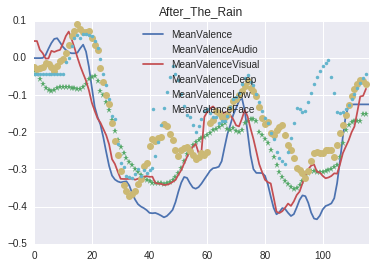

In [219]:
mov = 'Wanted'
mov = 'Islands'
mov='After_The_Rain'

df = predictAVscoreDevSet(mov)
dfa = getAnnotationDf(mov)
print dfa.shape

dfa[['MeanValence']].plot(ax=plt.gca(),title=mov)

df[['MeanValenceAudio']].plot(ax=plt.gca(), style=['*'], title=mov)
df[['MeanValenceVisual']].plot(ax=plt.gca(), style=['-'], title=mov)
df[['MeanValenceDeep']].plot(ax=plt.gca(), style=['+'], title=mov)
df[['MeanValenceLow']].plot(ax=plt.gca(), style=['o'], title=mov)
df[['MeanValenceFace']].plot(ax=plt.gca(), style=['.'], title=mov)


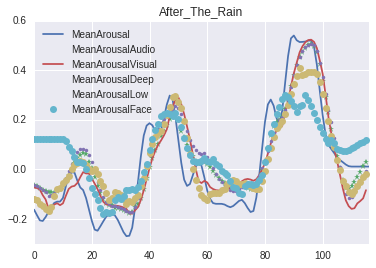

In [220]:
dfa[['MeanArousal']].plot(ax=plt.gca(),title=mov)

df[['MeanArousalAudio']].plot(ax=plt.gca(), style=['*'], title=mov)
df[['MeanArousalVisual']].plot(ax=plt.gca(), style=['-'], title=mov)
df[['MeanArousalDeep']].plot(ax=plt.gca(), style=['.'], title=mov)
df[['MeanArousalLow']].plot(ax=plt.gca(), style=['o'], title=mov)
df[['MeanArousalFace']].plot(ax=plt.gca(), style=['o'], title=mov)

#aa[['MeanArousalAudio']].plot(ax=plt.gca(), style=['*-'], title=mov)


In [221]:
def plotFigurePred(predictionfunction=predictAVscoreDevSet,
                   mov='Sintel',smoothing=True,
                   valcols=['MeanValenceAudio','MeanValenceVisual', 'MeanValenceDeep','MeanValenceLow','MeanValenceFace'],
                   arcols=['MeanArousalAudio','MeanArousalVisual', 'MeanArousalDeep','MeanArousalLow','MeanArousalFace'],
                   old=False):
    df = predictionfunction(mov, smoothing)
    dfa = getAnnotationDf(mov)
    

    f, axs = plt.subplots(2,1,figsize=(15,15))

    plt.subplot(2,1,1)
    dfa[['MeanValence']].plot(ax=plt.gca(),title=mov)

    df[valcols].plot(ax=plt.gca(),title=mov,style=['g*-','mo-','y^-','bx-','r*'])
    #df[['MeanValenceAudio']].plot(ax=plt.gca(),title=mov)
    if old:
        aa = getAVprediction(mov)
        aa[['MeanValenceAudio']].plot(ax=plt.gca(), style=['c*-'], title=mov)

    plt.subplot(2,1,2)
    dfa[['MeanArousal']].plot(ax=plt.gca(),title=mov)
    df[arcols].plot(ax=plt.gca(),title=mov,style=['g*-','mo-','y^-','bx-','r*'])
    #df[['MeanArousalAudio']].plot(ax=plt.gca(),title=mov)
    if old:
        aa[['MeanArousalAudio']].plot(ax=plt.gca(), style=['c*-'], title=mov)



((116, 1583), (117, 1271), (117, 4096), (122, 9), (117, 10))


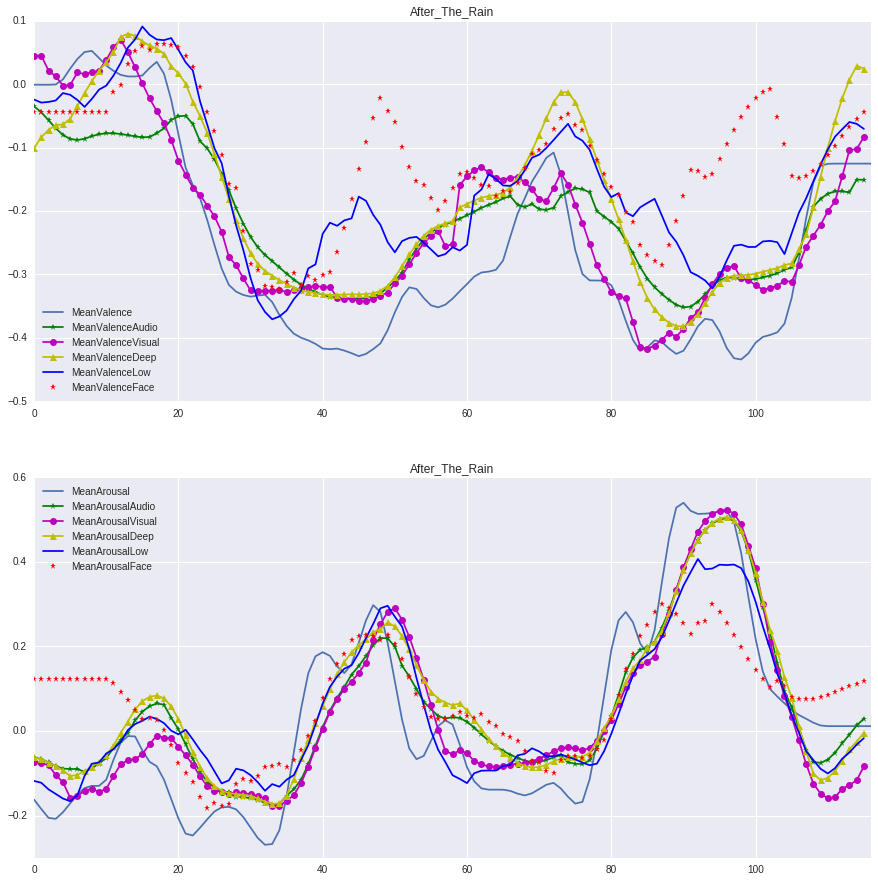

In [222]:
plotFigurePred(mov='After_The_Rain',smoothing=True)

((116, 1583), (117, 1271), (117, 4096), (122, 9), (117, 10))


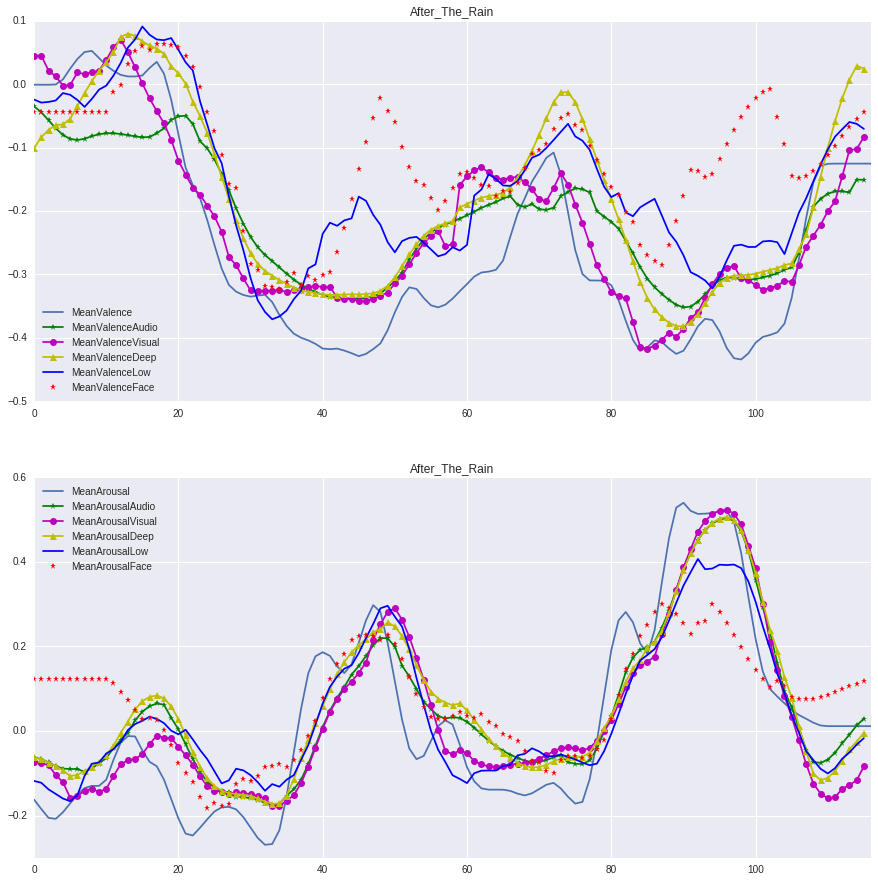

In [223]:
plotFigurePred(predictAVscoreDevSet,'After_The_Rain',smoothing=True)

((116, 1583), (117, 1271), (117, 4096), (122, 9))
((116, 1583), (117, 1271), (117, 4))


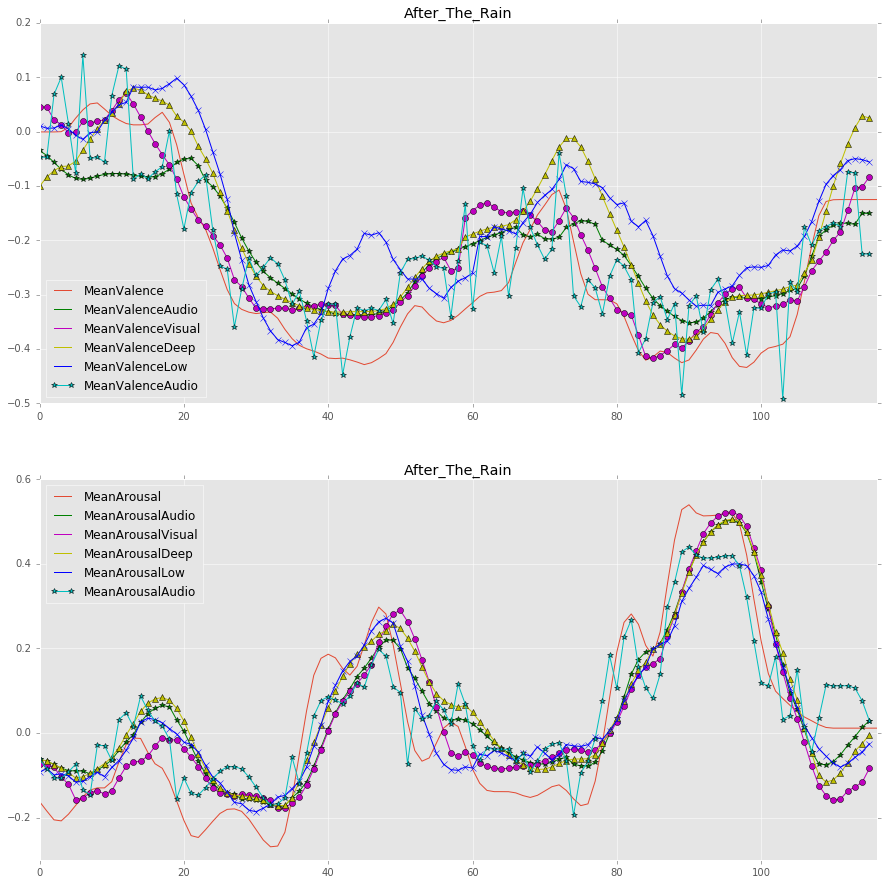

In [323]:
plotFigurePred(predictAVscoreDevSet,'After_The_Rain',smoothing=True,old=True)

((116, 1583), (117, 1271), (117, 4096), (122, 9))
((116, 1583), (117, 1271), (117, 4))


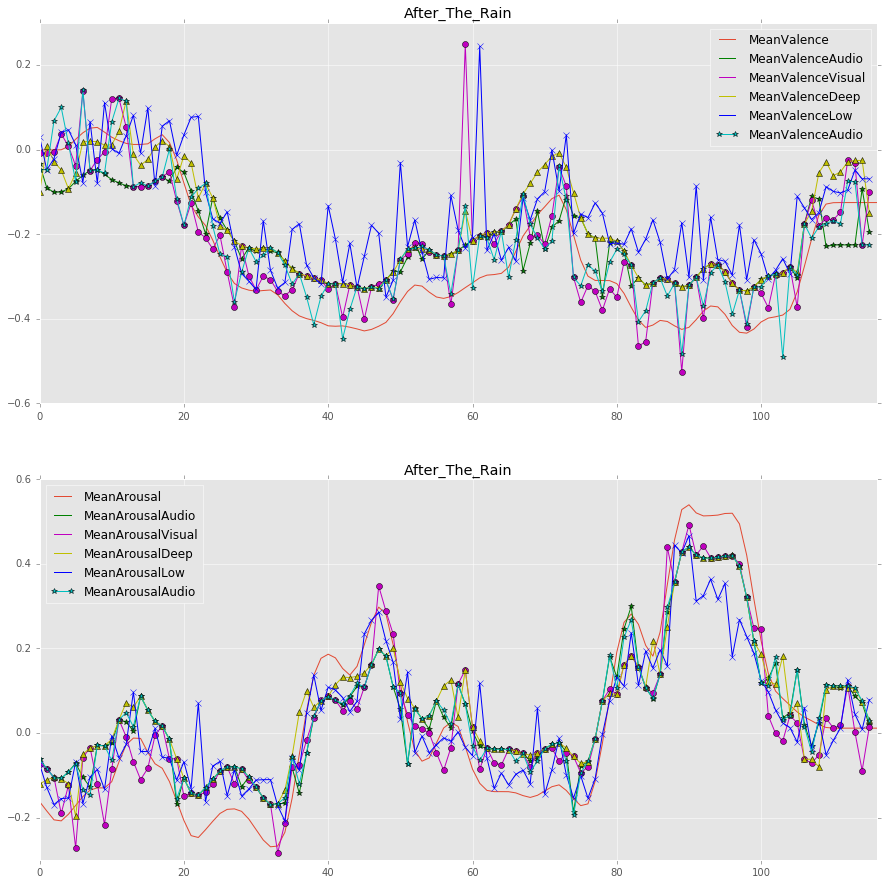

In [224]:
plotFigurePred('After_The_Rain',smoothing=False)

((176, 1583), (177, 1271), (177, 4096), (176, 9))
((176, 1583), (177, 1271), (176, 4))


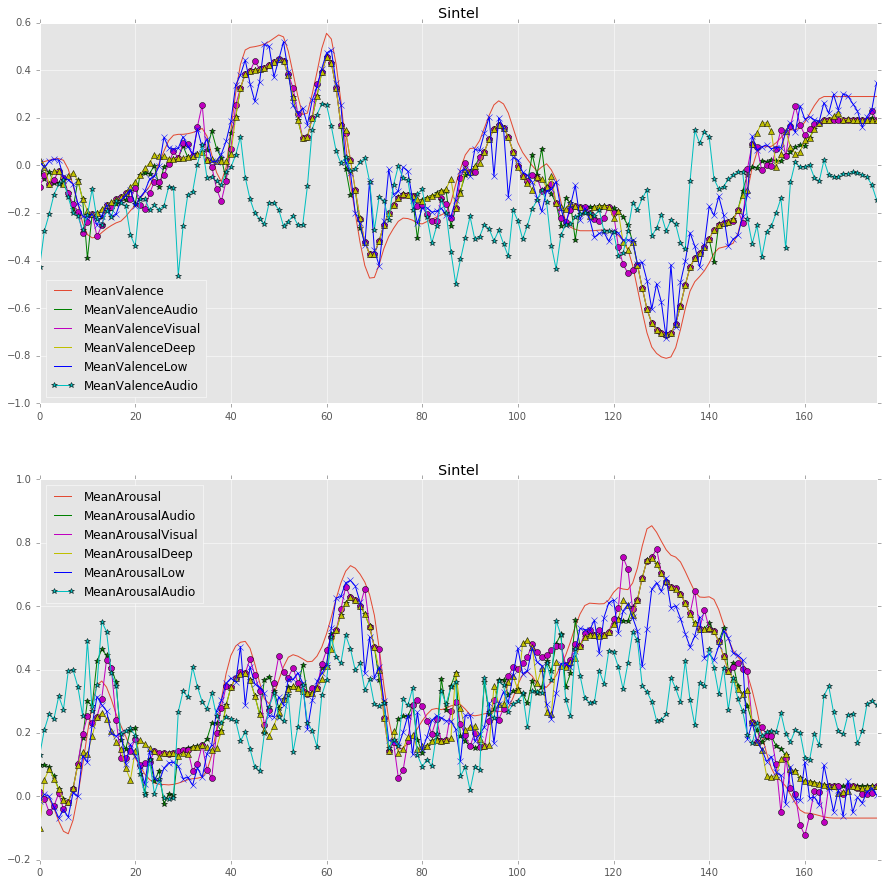

In [225]:
plotFigurePred('Sintel',smoothing=False)

## Visualization

It looks like the pipe are successfully predict the movie "Decay", since it was in all the traiing sets.
however 


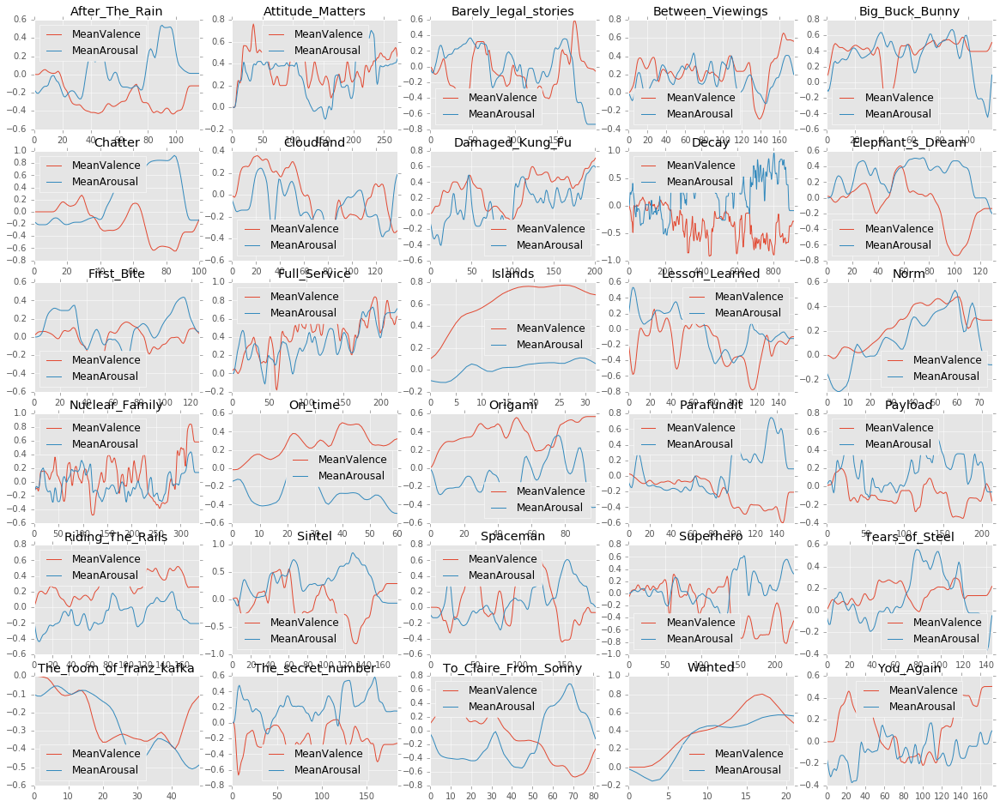

In [200]:
fix, axes = plt.subplots(figsize=(20,16))
for ii, mov in enumerate(movieNames):
    plt.subplot(6,5,ii+1)
    dfa = getAnnotationDf(mov)
    dfa[['MeanValence','MeanArousal']].plot(ax=plt.gca(),title=mov)
    #dev_set[mov][['MeanValence','MeanArousal']].plot(ax=plt.gca(),title=mov)



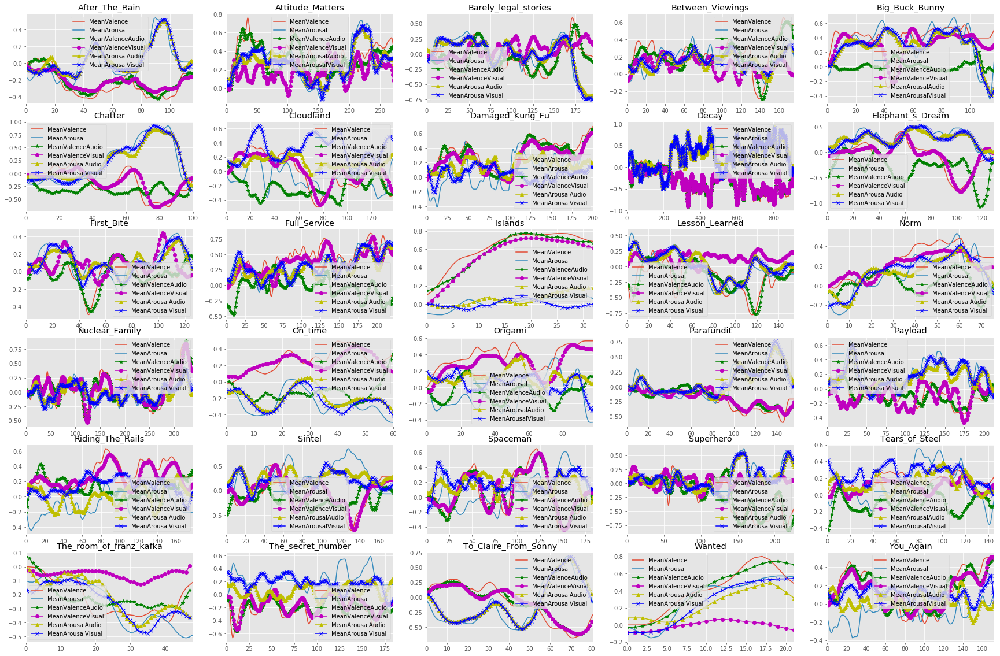

In [74]:
fix, axes = plt.subplots(figsize=(30,20))
for ii, mov in enumerate(movieNames):
    plt.subplot(6,5,ii+1)
    dfa = getAnnotationDf(mov)
    dfa[['MeanValence','MeanArousal']].plot(ax=plt.gca(),title=mov)
    idev_set[mov].plot(ax=plt.gca(),title=mov,style=['g*-','mo-','y^-','bx-'])


In [164]:
def getAVscoreTestSet(f,smoothing=True):   ## for test set
    
        audiodf = getAudioDf(f,folder=med2017audiofolderTest)
        visualdf = getAvgVisFeatListDf(f,visual_feat_list,
                                   folder=med2017visualfolderTest)
        deepdf = getAvgVisFeatListDf(f,['fc6'],
                                    folder=med2017visualfolderTest)
        lowdf = getLowFeature10SecDf(f)        
        facedf = getFaceFeature(f)       
        
        #This is test set there is no annotation
        #annotdf = getAnnotationDf(f)
        #ya = df2mat(annotdf[['MeanArousal']])
        #yv = df2mat(annotdf[['MeanValence']])
        #ya = ya[:mlen]
        #yv = yv[:mlen]
        
        
        print(audiodf.shape,visualdf.shape,deepdf.shape,lowdf.shape,facedf.shape)

        mlen = min([len(audiodf),len(visualdf),len(deepdf),len(lowdf)])

        audiodf = audiodf[:mlen]
        visualdf = visualdf[:mlen]
        deepdf = deepdf[:mlen]
        lowdf = lowdf[:mlen]
        facedf= facedf[:mlen]
        
        
        aa = paraud.predict(audiodf)     
        va = pvalaud.predict(audiodf)
        
        av = parvis.predict(visualdf)
        vv = pvalvis.predict(visualdf)
        
        ad = pardeep.predict(deepdf)
        vd = pvaldeep.predict(deepdf)
        
        al = parlow.predict(lowdf)
        vl = pvallow.predict(lowdf)
        
        af = parface.predict(facedf)
        vf = pvalface.predict(facedf)
    

        if smoothing:
            aa = holt_winters_second_order_ewma( aa, 10, 0.3 )
            av = holt_winters_second_order_ewma( av, 10, 0.3 )
            va = holt_winters_second_order_ewma( va, 10, 0.3 )
            vv = holt_winters_second_order_ewma( vv, 10, 0.3 )
            ad = holt_winters_second_order_ewma( ad, 10, 0.3 )
            al = holt_winters_second_order_ewma( al, 10, 0.3 )
            vd = holt_winters_second_order_ewma( vd, 10, 0.3 )
            vl = holt_winters_second_order_ewma( vl, 10, 0.3 )
            af = holt_winters_second_order_ewma( af, 10, 0.3 )
            vf = holt_winters_second_order_ewma( vf, 10, 0.3 )
         
        return [aa,av,ad,al,af],[va,vv,vd,vl,vf]

In [225]:
def writeToFile(f,valence_scores,arousal_scores):
    df = pd.DataFrame(np.transpose([valence_scores, arousal_scores]), columns=['MeanValence','MeanArousal'])
    sfilename= f+".csv"
    df.to_csv(sfilename, index=False)

def appendToFile(movie,fname,valence,arousal):
    fd = open(fname, 'a')
    fd.write(movie+'\n')  # python will convert \n to os.linesep
    fd.close()
    df = pd.DataFrame(np.transpose([valence, arousal]), columns=['MeanValence','MeanArousal'])
    df.to_csv(fname, sep=' ', index=False, header=False, mode='a')

In [166]:
[aa,av,ad,al,af],[va,vv,vd,vl,vf] = getAVscoreTestSet('MEDIAEVAL17_07')

((41, 1583), (41, 1271), (41, 4096), (42, 9), (41, 10))


In [167]:
fname = './me17ei_audio_smooth.txt'
aa.shape,va.shape
df = pd.DataFrame(np.transpose([va, aa]), columns=['MeanValence','MeanArousal'])
df.to_csv(fname, sep=' ', index=False, header=False, mode='a')

In [168]:
df.head()

,MeanValence,MeanArousal
0,-0.034820,0.125025
1,-0.006871,0.164300
2,-0.019940,0.200487
3,-0.021618,0.202558
4,-0.045984,0.223224


In [226]:
audiopipefile = './pipe_results/me17ei_audio_smooth.txt'
visualpipefile = './pipe_results/me17ei_visual_smooth.txt'
deeppipefile = './pipe_results/me17ei_deep_smooth.txt'
lowlevelpipefile = './pipe_results/me17ei_lowlevel_smooth.txt'
facepipefile = './pipe_results/me17ei_face_smooth.txt'

for f in testmovieNames:
    [aa,av,ad,al,af],[va,vv,vd,vl,vf] = getAVscoreTestSet(f)
    appendToFile(f,audiopipefile,va,aa)
    appendToFile(f,visualpipefile,vv,av)
    appendToFile(f,deeppipefile,vd,ad)
    appendToFile(f,lowlevelpipefile,vl,al)
    appendToFile(f,facepipefile,vf,af)
    
    

((702, 1583), (703, 1271), (703, 4096), (732, 9), (702, 10))
((167, 1583), (168, 1271), (168, 4096), (168, 9), (168, 10))
((943, 1583), (944, 1271), (944, 4096), (984, 9), (943, 10))
((1091, 1583), (1092, 1271), (1092, 4096), (1128, 9), (1091, 10))
((151, 1583), (152, 1271), (152, 4096), (157, 9), (151, 10))
((1251, 1583), (1251, 1271), (1251, 4096), (1251, 9), (1251, 10))
((1117, 1583), (1118, 1271), (1118, 4096), (1117, 9), (1117, 10))
((41, 1583), (41, 1271), (41, 4096), (42, 9), (41, 10))
((40, 1583), (41, 1271), (41, 4096), (42, 9), (41, 10))
((41, 1583), (41, 1271), (41, 4096), (42, 9), (41, 10))
((41, 1583), (41, 1271), (41, 4096), (42, 9), (41, 10))
((41, 1583), (41, 1271), (41, 4096), (42, 9), (41, 10))
((41, 1583), (41, 1271), (41, 4096), (43, 9), (41, 10))
((41, 1583), (41, 1271), (41, 4096), (42, 9), (41, 10))


In [227]:
audiopipefile = './pipe_results/me17ei_audio_nosmooth.txt'
visualpipefile = './pipe_results/me17ei_visual_nosmooth.txt'
deeppipefile = './pipe_results/me17ei_deep_nosmooth.txt'
lowlevelpipefile = './pipe_results/me17ei_lowlevel_nosmooth.txt'
facepipefile = './pipe_results/me17ei_face_nosmooth.txt'

for f in testmovieNames:
    [aa,av,ad,al,af],[va,vv,vd,vl,vf] = getAVscoreTestSet(f,smoothing=False)
    appendToFile(f,audiopipefile,va,aa)
    appendToFile(f,visualpipefile,vv,av)
    appendToFile(f,deeppipefile,vd,ad)
    appendToFile(f,lowlevelpipefile,vl,al)
    appendToFile(f,facepipefile,vf,af)


((702, 1583), (703, 1271), (703, 4096), (732, 9), (702, 10))
((167, 1583), (168, 1271), (168, 4096), (168, 9), (168, 10))
((943, 1583), (944, 1271), (944, 4096), (984, 9), (943, 10))
((1091, 1583), (1092, 1271), (1092, 4096), (1128, 9), (1091, 10))
((151, 1583), (152, 1271), (152, 4096), (157, 9), (151, 10))
((1251, 1583), (1251, 1271), (1251, 4096), (1251, 9), (1251, 10))
((1117, 1583), (1118, 1271), (1118, 4096), (1117, 9), (1117, 10))
((41, 1583), (41, 1271), (41, 4096), (42, 9), (41, 10))
((40, 1583), (41, 1271), (41, 4096), (42, 9), (41, 10))
((41, 1583), (41, 1271), (41, 4096), (42, 9), (41, 10))
((41, 1583), (41, 1271), (41, 4096), (42, 9), (41, 10))
((41, 1583), (41, 1271), (41, 4096), (42, 9), (41, 10))
((41, 1583), (41, 1271), (41, 4096), (43, 9), (41, 10))
((41, 1583), (41, 1271), (41, 4096), (42, 9), (41, 10))


# visualizations for movies

In [100]:
'''
for m in movieNames:
    cuts = getShotDf(m)['time']
    for i in range(len(cuts)):
        plt.axvline(x=cuts[i],linestyle='-',color='black')
    plotFigurePred(predictAVscoreDevSet,mov=m,smoothing=True)
'''

"\nfor m in movieNames:\n    cuts = getShotDf(m)['time']\n    for i in range(len(cuts)):\n        plt.axvline(x=cuts[i],linestyle='-',color='black')\n    plotFigurePred(predictAVscoreDevSet,mov=m,smoothing=True)\n"

((116, 1583), (117, 1271), (117, 4096), (122, 9), (117, 10))
((273, 1583), (273, 1271), (273, 4096), (282, 9), (273, 10))
((196, 1583), (197, 1271), (197, 4096), (205, 9), (196, 10))
((176, 1583), (176, 1271), (176, 4096), (176, 9), (176, 10))
((118, 1583), (118, 1271), (118, 4096), (118, 9), (118, 10))
((100, 1583), (101, 1271), (101, 4096), (101, 9), (101, 10))
((139, 1583), (139, 1271), (139, 4096), (139, 9), (139, 10))
((201, 1583), (202, 1271), (202, 4096), (202, 9), (202, 10))
((912, 1583), (912, 1271), (912, 4096), (951, 9), (912, 10))
((129, 1583), (130, 1271), (130, 4096), (129, 9), (129, 10))
((127, 1583), (127, 1271), (127, 4096), (127, 9), (127, 10))
((223, 1583), (223, 1271), (223, 4096), (230, 9), (223, 10))
((33, 1583), (34, 1271), (34, 4096), (35, 9), (33, 10))
((154, 1583), (155, 1271), (155, 4096), (160, 9), (154, 10))
((77, 1583), (77, 1271), (77, 4096), (77, 9), (77, 10))
((339, 1583), (339, 1271), (339, 4096), (353, 9), (339, 10))
((61, 1583), (61, 1271), (61, 4096

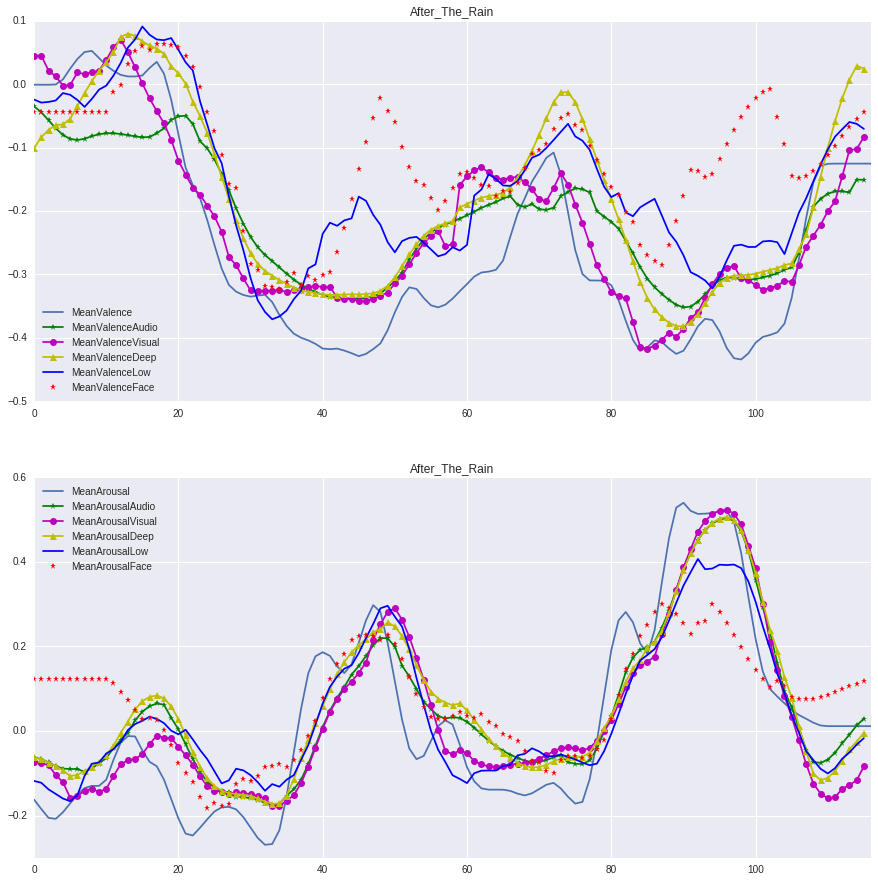

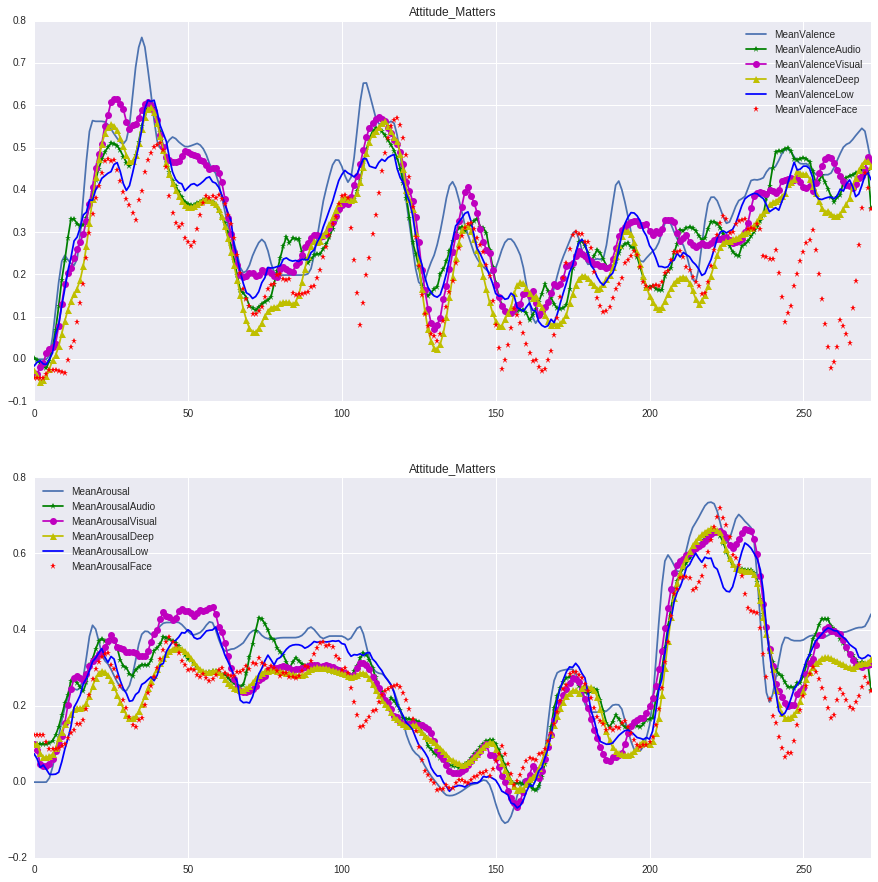

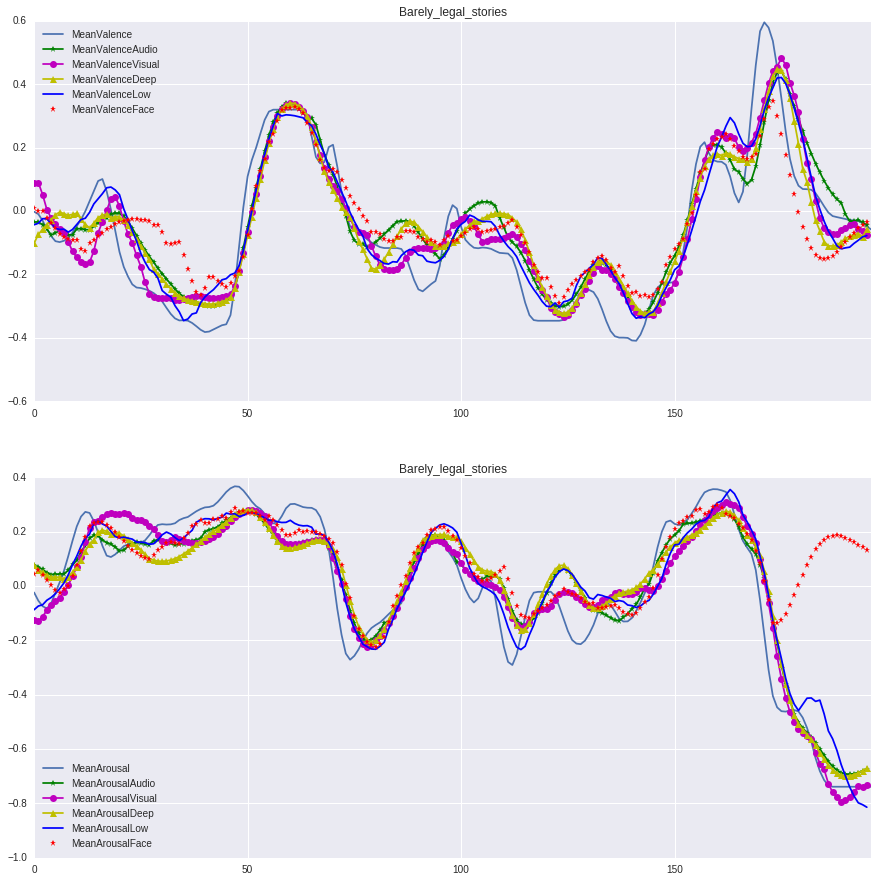

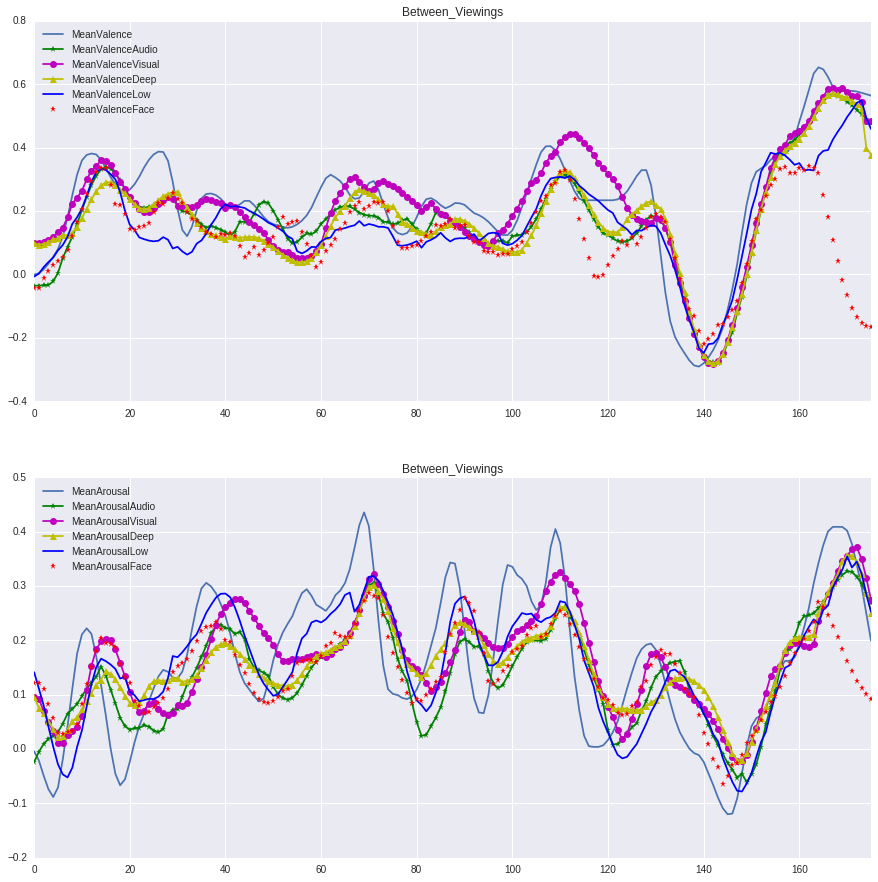

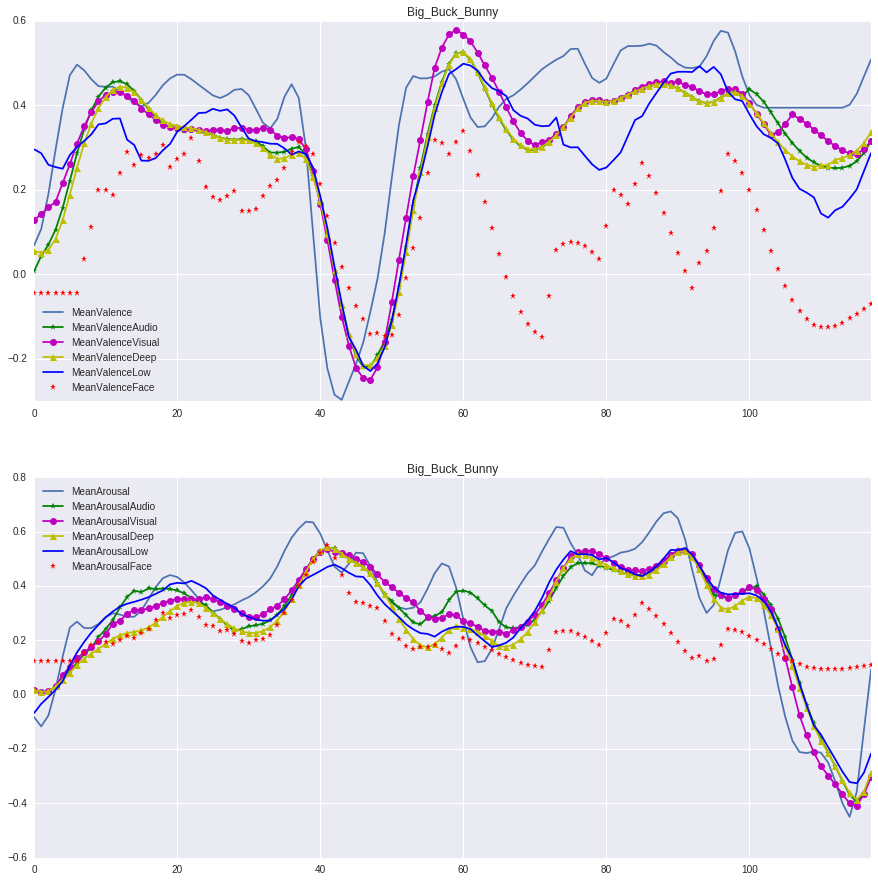

...

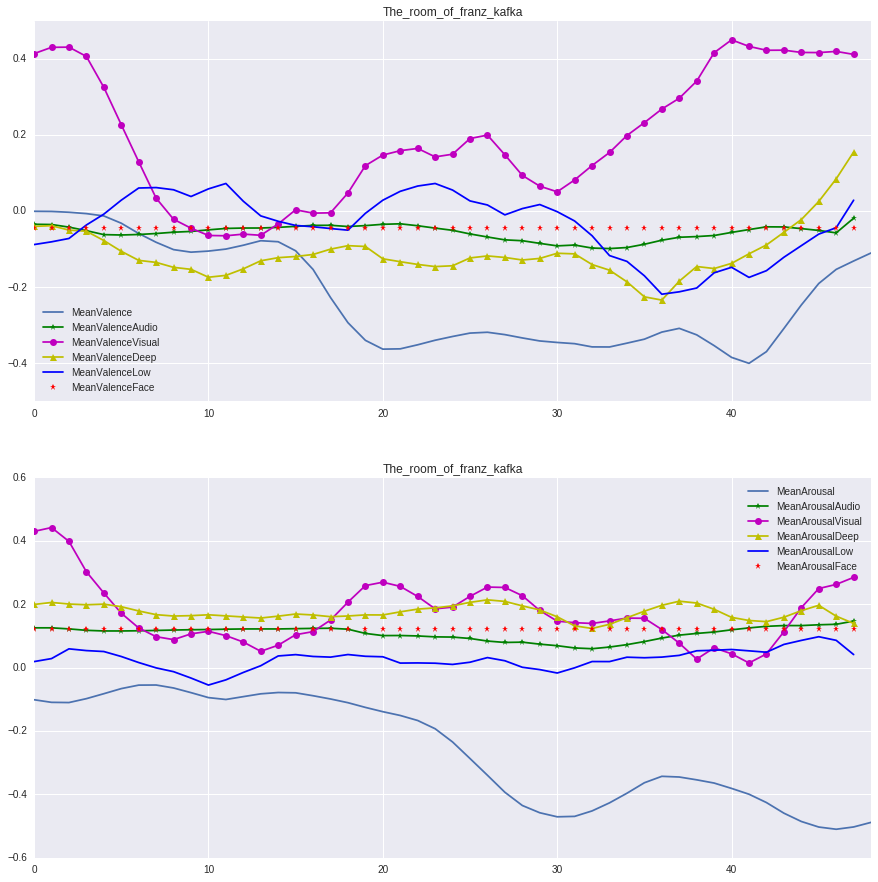

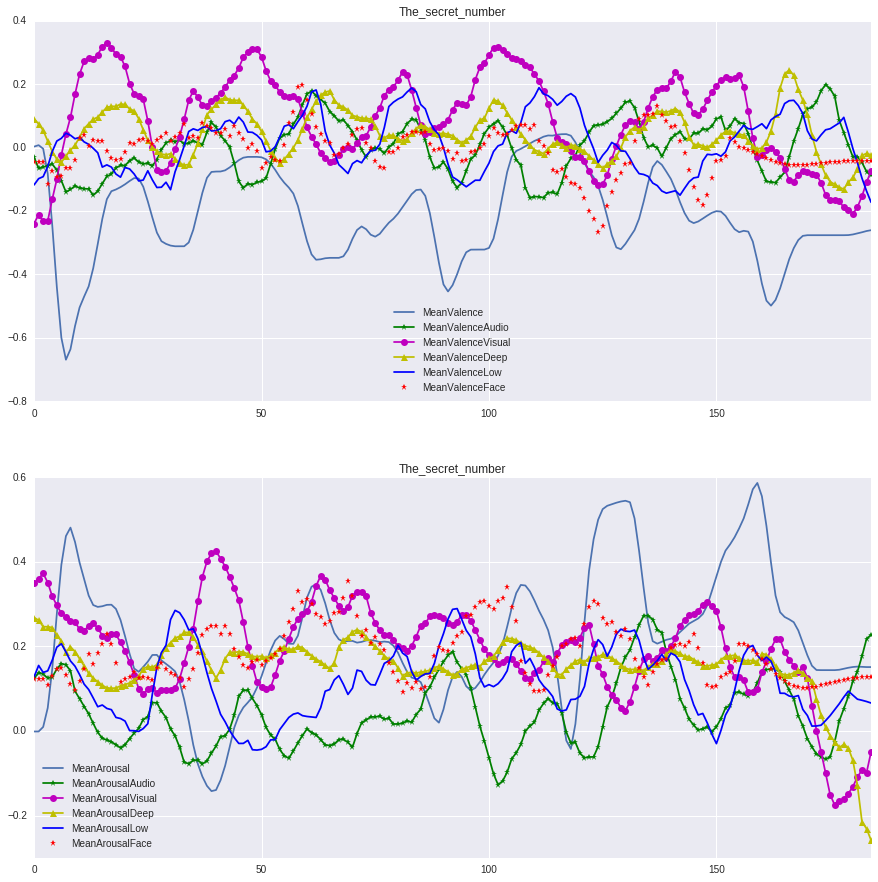

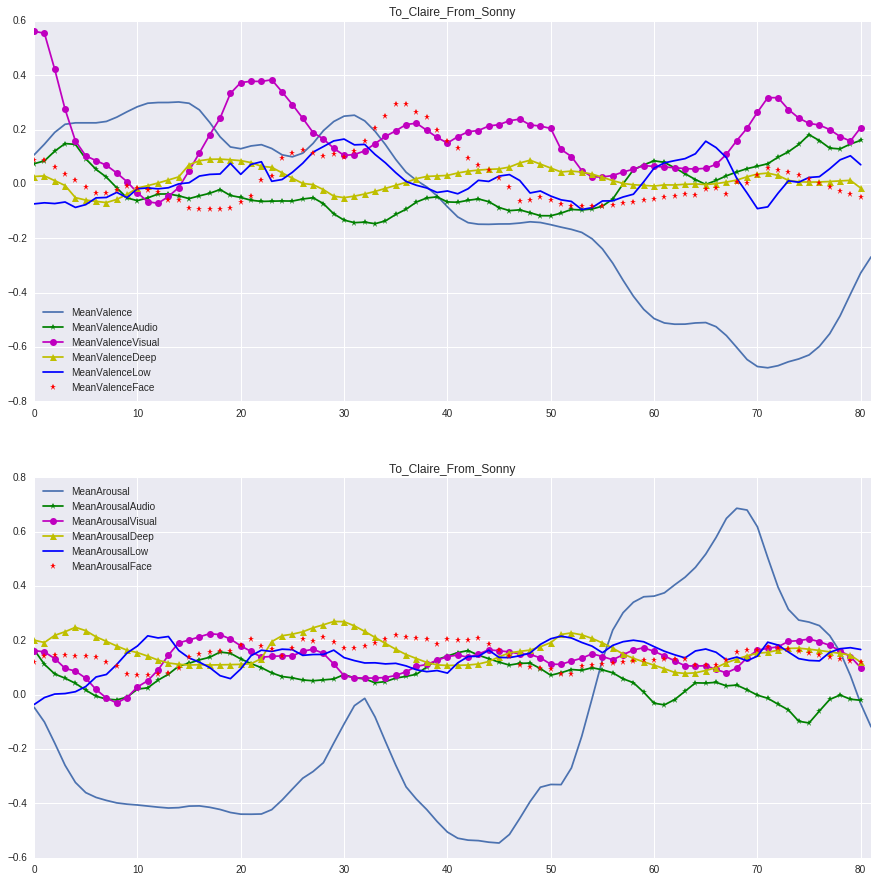

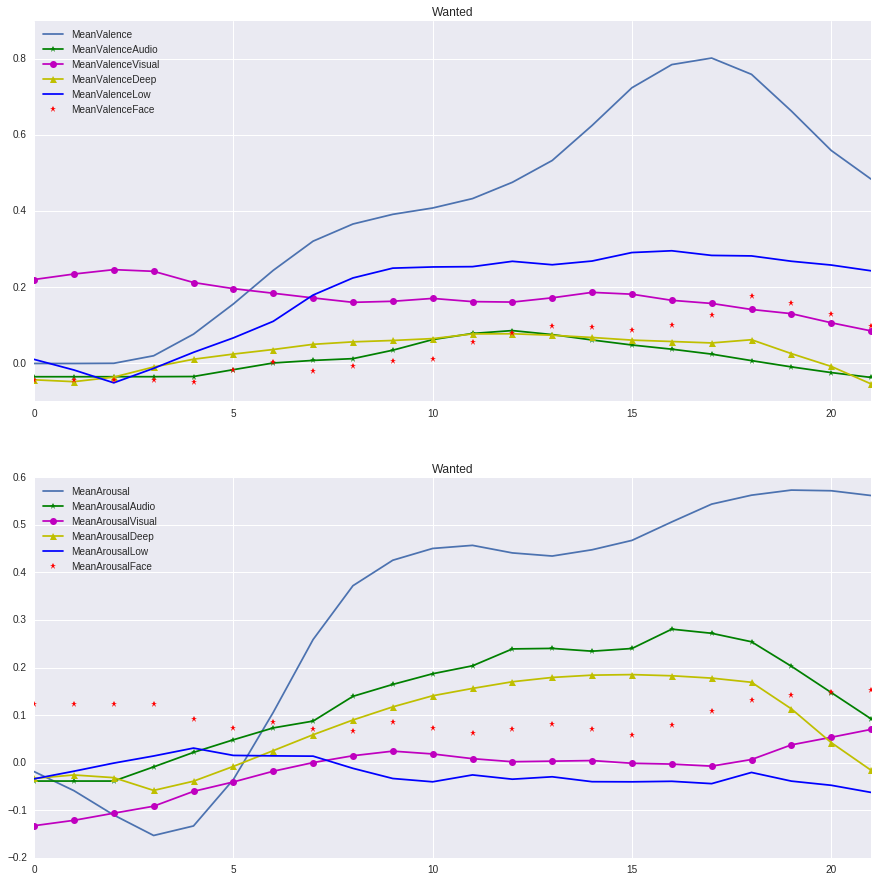

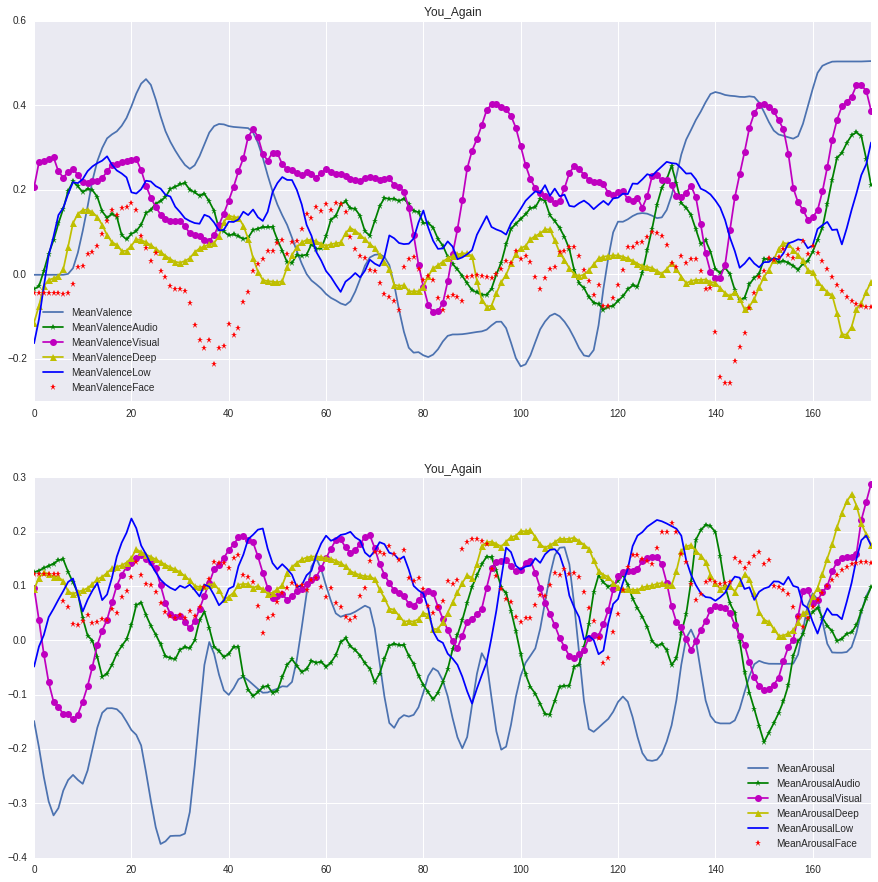

In [224]:
for m in movieNames:
    plotFigurePred(predictAVscoreDevSet,mov=m,smoothing=True)